In [1]:
import brian2 as b2 # used for neural simulation
from brian2 import *

import numpy as np # used for array operations
from scipy.stats import poisson, binom, f, multivariate_normal, stats # used for stats (mean, s.d.)
from scipy import stats
from scipy.special import gammaln

import matplotlib.pyplot as plt # used for plotting
from matplotlib import gridspec
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

import math
import random
import warnings
import json

b2.prefs.codegen.target = "numpy" # set Brian2 to use numpy backend

# from sklearn.feature_selection import f_classif
# from brian2 import NeuronGroup, Synapses, PoissonGroup, SpikeMonitor, run, ms, Hz, PoissonInput, clear_cache, device, get_unit, second

In [2]:
%run neural_simulation_functions.py
# %run neural_simulation_functions.ipynb

#fix it to be a .py file not a .ipynb file

In [3]:
#import the python file
# once everything is good run this

#from neural_simulation_functions import *

Parameters.

In [5]:
num_neurons = 10 # try 10 just to see covariance matrices
rate = 10 # change back to 10
rates = np.linspace(5, 15, num_neurons) # change back to np.linspace(5, 14, num_neurons)
time = 1000
num_samples = 100 # change to 100 to show Alex next time, but plot the first five trajectories or random five 
t0 = 200
time_points = np.arange(0, 1000)

In [6]:
rates

array([ 5.        ,  6.11111111,  7.22222222,  8.33333333,  9.44444444,
       10.55555556, 11.66666667, 12.77777778, 13.88888889, 15.        ])

In [7]:
# Single rate absolute (perturbation magnitude with rate): std_dev = perturbation_magnitude * base_rates[neuron]
#perturbed_rate1 = generate_perturbed_rates(num_neurons, rate, perturbation_magnitude = 0.1, relative=True)
# each neuron has a rate of 10 hz
#print(perturbed_rate1)

# Single rate relative (perturbation magnitude without rate): std_dev = perturbation_magnitude
#perturbed_rate2 = generate_perturbed_rates(num_neurons, rate, perturbation_magnitude = 0.1, relative=False)
# each neuron has a rate of 10 hz
#print(perturbed_rate2)

In [8]:
perturbed_rates1 = generate_perturbed_rates(num_neurons, rates, perturbation_magnitude = 0.1, relative=True)
print(perturbed_rates1)

#perturbed_rates2 = generate_perturbed_rates(num_neurons, rates, perturbation_magnitude = 0.1, relative=False)
#print(perturbed_rates2)

[ 4.58588441  6.54283154  6.43572441  8.69030955  9.03056031 12.55877979
 12.21744361 14.43846235 13.73814436 15.65031601]


In [9]:
# Simulation control parameters

# Network parameters
N_E = 1000
#gamma = 0.25                    # ratio of inhibitory to excitatory neurons
#N_I = round(gamma * N_E)
#N = N_E + N_I
epsilon = 0.5                   # Sparsity of connections.  changed from 0.1, 0.2 was fine...
#C_E = epsilon * N_E             # number of excitatory connections per neuron
#C_ext = C_E                     # external connections per neuron


# Neuron parameters
#tau = 20  * ms                  # Membrane time constant. previously 20, tried 50 it was weird, larger numbers more spikes, smaller numbers less spikes
                                # Higher Tau means slower decay, more spikes.
                                # Lower Tau means faster decay, fewer spikes
#theta = 20  * mV                # spike threshold voltage, neuron fires when hitting this value
#V_r = 10  * mV                  # reset potential, voltage neuron goes back to after firing
#tau_rp = 2  * ms                # refractory period (neuron needs to wait some time before spiking again)

# Synapse parameters
#J = 0.1 * mV                    # Synaptic strength # Previously 0.1 * mV, previouysly 0.075, 0.2 was too varied need to be more consistent
                                # larger J, stronger synaptic input, higher firing rate
                                # smaller J, weaker input, lower firing rates
#D = 1.5  * ms                   # synaptic delay, time between a pre spike and its effect on postsynap neuron

# Simulation settings
#dt = 0.1  * ms
g = 4                           # g is a good control for manipulating the firing rate, smaller numbers more spikes, bigger numbers less spikes
                                # Higher g, stronger inhibition, suppresses network activity
                                # Lower g, weaker inhibition, increase network activity
nu_ext_over_nu_thr = 1          # Previously 2, 1.2 was weird, 1 (made 2d plot nice), 0.5 not good,
# t_range = [1000, 1200]
# rate_range = [0, 200]
# rate_tick_step = 50

#nu_thr = theta / (J * C_E * tau) # minimal input rate needed to reach threshold
#nu_ext = nu_ext_over_nu_thr * nu_thr # external input rate

# adjust g and nu_ext so that nu_ext is approximately the number of spikes that are occuring, influenced by g. 
# epsilon 0.2 and g = 2.6, g = 2.8 is too much,tau = 50
# epsilon 0.5 and g = 4, tau = 20

Generating spike trains, then counting the spikes.

In [11]:
raw_spike_train = independent_poisson_processes(num_neurons, time, num_samples, rate = rate)
# print(raw_spike_train)

In [12]:
save_spike_trains(raw_spike_train, "spike_trains.json")
loaded_spike_trains = load_spike_trains("spike_trains.json")
# print(loaded_spike_trains)

Spike trains saved to spike_trains.json


In [13]:
spike_train = standardize_units(raw_spike_train)
# print(spike_train)

In [14]:
raw_multi_rate_spike_train = multivariate_constant_poisson(num_neurons, time, num_samples, rates = rates)

WARNING    'rates' is an internal variable of group 'poissongroup', but also exists in the run namespace with the value array([ 5.        ,  6.11111111,  7.22222222,  8.33333333,  9.44444444,
       10.55555556, 11.66666667, 12.77777778, 13.88888889, 15.        ]). The internal variable will be used. [brian2.groups.group.Group.resolve.resolution_conflict]


In [15]:
save_spike_trains(raw_multi_rate_spike_train, "multi_rate_spike_trains.json")
loaded_spike_trains = load_spike_trains("multi_rate_spike_trains.json")

Spike trains saved to multi_rate_spike_trains.json


In [16]:
multi_rate_spike_train = standardize_units(raw_multi_rate_spike_train)

In [17]:
raw_perturbed_rate_spike_train = multivariate_constant_poisson(num_neurons, time, num_samples, rates = perturbed_rates1)

WARNING    'rates' is an internal variable of group 'poissongroup', but also exists in the run namespace with the value array([ 4.58588441,  6.54283154,  6.43572441,  8.69030955,  9.03056031,
       12.55877979, 12.21744361, 14.43846235, 13.73814436, 15.65031601]). The internal variable will be used. [brian2.groups.group.Group.resolve.resolution_conflict]


In [18]:
save_spike_trains(raw_perturbed_rate_spike_train, "perturbed_rate_spike_trains.json")
loaded_spike_trains = load_spike_trains("perturbed_rate_spike_trains.json")

Spike trains saved to perturbed_rate_spike_trains.json


In [19]:
perturbed_rate_spike_train = standardize_units(raw_perturbed_rate_spike_train)

In [20]:
# first_spike = find_nth_earliest_spike(spike_train, n=2)

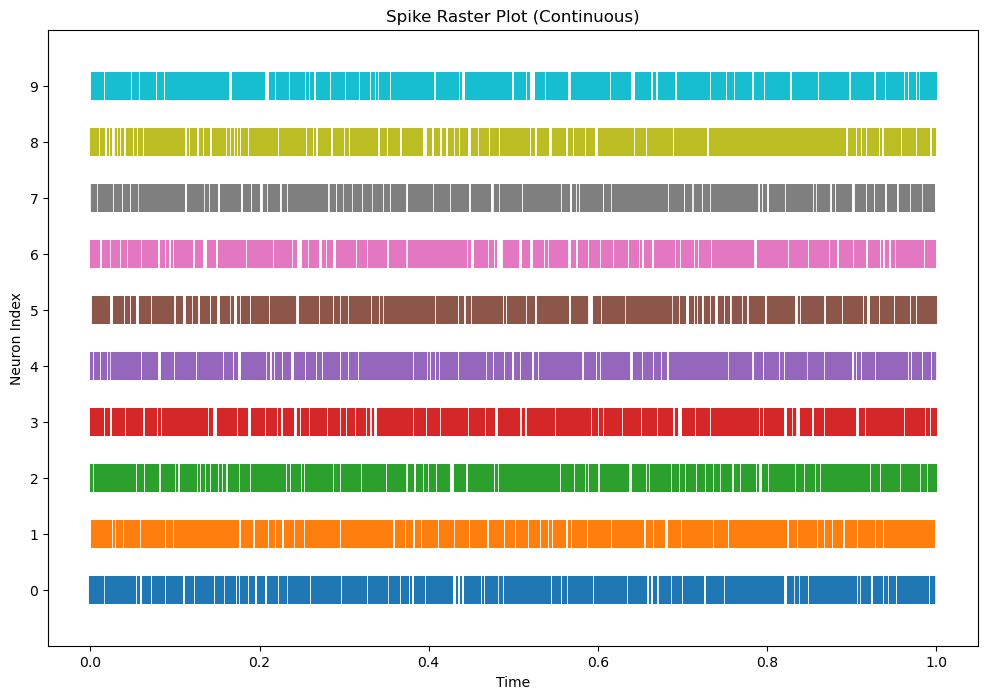

In [21]:
raster_plot(spike_train, colors=None, linelengths=None, figsize=(12,8))

In [22]:
binary_spikes = spikes_to_binary(spike_train, num_neurons, time)
multi_rate_binary_spikes = spikes_to_binary(multi_rate_spike_train, num_neurons, time)
perturbed_rate_binary_spikes = spikes_to_binary(perturbed_rate_spike_train, num_neurons, time)

In [23]:
spike_count = count_spikes(binary_spikes)
count = np.array(spike_count)
# print(count)
# print(count.shape)
multi_rate_spike_count = count_spikes(multi_rate_binary_spikes)
multi_rate_count = np.array(multi_rate_spike_count)

perturbed_rate_spike_count = count_spikes(perturbed_rate_binary_spikes)
perturbed_rate_count = np.array(perturbed_rate_spike_count)

In [24]:
random_indices = np.random.choice(count.shape[0], size=5, replace=False)  # No duplicates
random_samples = count[random_indices]  # Shape: (5, neurons, time)

Getting spike trains from excitatory and inhibitory neurons, then counting the spikes.

In [26]:
# results = sim(params["g"], params["nu_ext_over_nu_thr"], params["t_range"][1] * ms, ax_spikes, ax_rates, params["rate_tick_step"], num_neurons, num_samples)
results = sim(N_E, epsilon, g, nu_ext_over_nu_thr, time, num_neurons, num_samples)

raw_excitatory_spike_trains = results['excitatory']['spike_trains']
raw_inhibitory_spike_trains = results['inhibitory']['spike_trains']
# print(raw_excitatory_spike_trains)

In [27]:
save_spike_trains(raw_excitatory_spike_trains, "spike_trains_ex.json")
loaded_spike_trains_ex = load_spike_trains("spike_trains_ex.json")

save_spike_trains(raw_inhibitory_spike_trains, "spike_trains_in.json")
loaded_spike_trains_in = load_spike_trains("spike_trains_in.json")

Spike trains saved to spike_trains_ex.json
Spike trains saved to spike_trains_in.json


In [28]:
excitatory_spike_trains = standardize_units(raw_excitatory_spike_trains)
inhibitory_spike_trains = standardize_units(raw_inhibitory_spike_trains)

#print(excitatory_spike_trains[0])
#print(inhibitory_spike_trains[0])

In [29]:
#first_spike_ex = find_nth_earliest_spike(excitatory_spike_trains, n=2)
#first_spike_in = find_nth_earliest_spike(inhibitory_spike_trains, n=2)

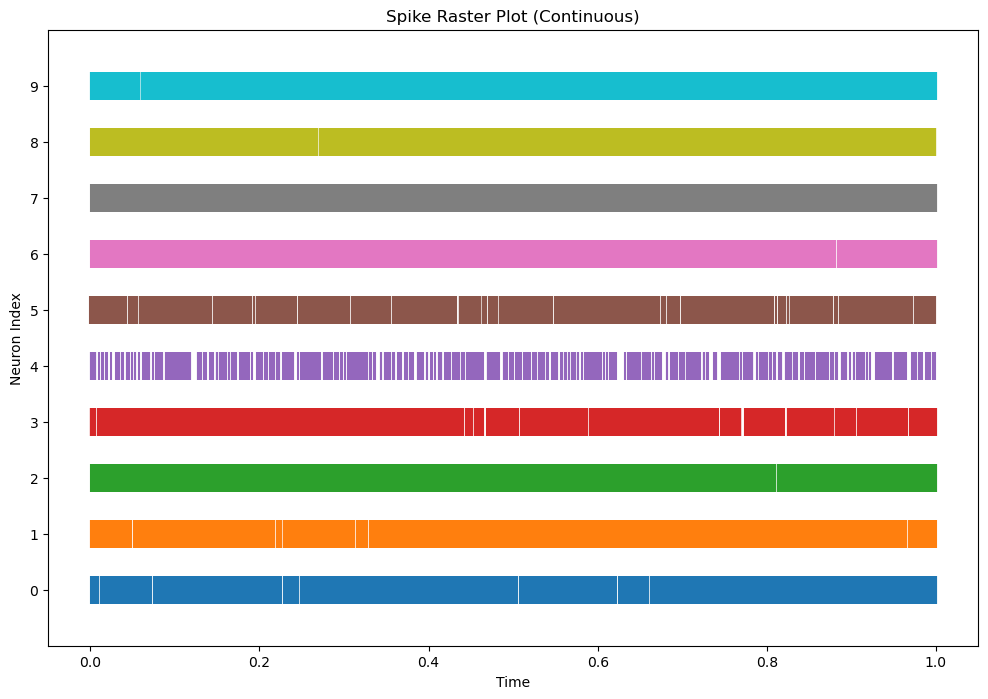

In [30]:
raster_plot(excitatory_spike_trains, colors=None, linelengths=None, figsize=(12,8))

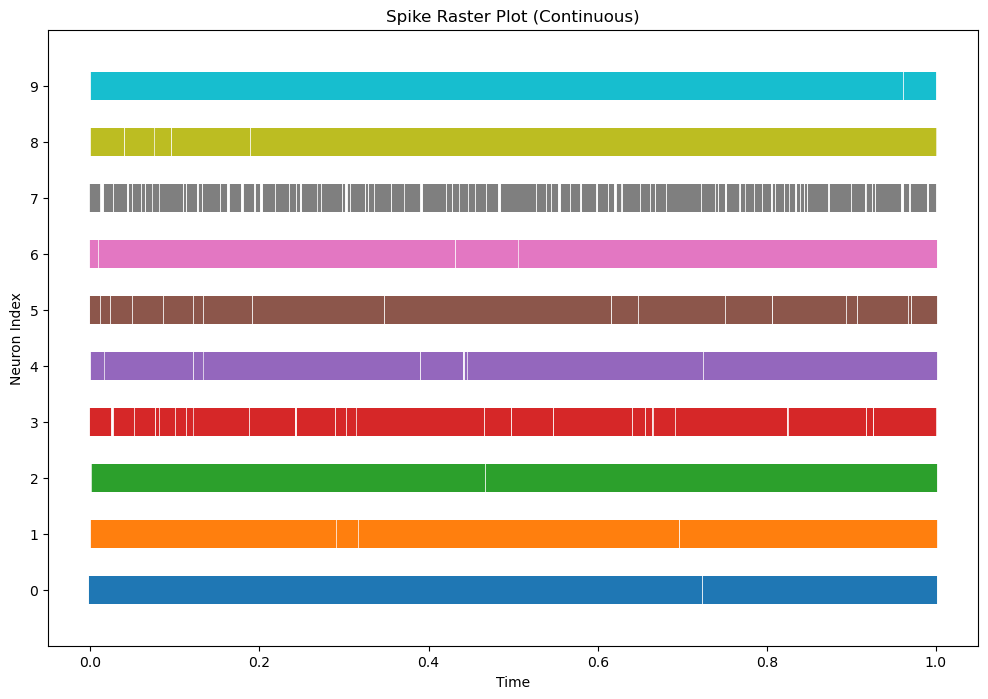

In [31]:
raster_plot(inhibitory_spike_trains, colors=None, linelengths=None, figsize=(12,8))

In [32]:
binary_ex_spikes = spikes_to_binary(excitatory_spike_trains, num_neurons, time)
binary_in_spikes = spikes_to_binary(inhibitory_spike_trains, num_neurons, time)
# print(binary_ex_spikes[0][0]) # first sample of first neuron

In [33]:
spike_count_ex = count_spikes(binary_ex_spikes)
count_ex = np.array(spike_count_ex)
#print(spike_count_ex[0])
#print(count_ex[0])
#print(count_ex[1])
#print(count_ex.shape)

spike_count_in = count_spikes(binary_in_spikes)
count_in = np.array(spike_count_in)
#print(count_in.shape)

In [34]:
random_indices_ex = np.random.choice(count_ex.shape[0], size=5, replace=False)  # No duplicates
random_samples_ex = count_ex[random_indices_ex]  # Shape: (5, neurons, time)

random_indices_in = np.random.choice(count_in.shape[0], size=5, replace=False)  # No duplicates
random_samples_in = count_in[random_indices_in]  # Shape: (5, neurons, time)

Theoretical and Empirical stats of raw counts.

In [36]:
# empirical_mean = empirical_means(count) # np.mean(count, axis=0), count.mean(axis=0)
empirical_mean = count.mean(axis=0)
#print(empirical_mean.shape)
count_rate = empirical_mean[:, -1]
#print(count_rate.shape)
#print(empirical_mean)
#print(empirical_mean.shape)
#print(count_rate)

# empirical_std_dev = std_dev_empirical_mean(empirical_mean, num_samples, count)
empirical_std_dev = np.sqrt(empirical_mean) #count.std(axis=0, ddof=1)
# empirical_std_dev = (count.std(axis=0)) #newly added, should be the same but isn't
# i fixed the above by using empirical_std_dev = (count.std(axis=0, ddof=1))
#print(empirical_std_dev)
#print(empirical_std_dev.shape)

empirical_lower_bound, empirical_upper_bound = confidence_intervals(empirical_mean, empirical_std_dev, num_samples, confidence_level=0.95)
# print(empirical_lower_bound)
# print(empirical_upper_bound)

In [37]:
multi_rate_empirical_mean = multi_rate_count.mean(axis=0)
multi_rate_count_rate = multi_rate_empirical_mean[:, -1]
multi_rate_empirical_std_dev = np.sqrt(multi_rate_empirical_mean) #count.std(axis=0, ddof=1)

multi_rate_empirical_lower_bound, multi_rate_empirical_upper_bound = confidence_intervals(multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, confidence_level=0.95)

In [38]:
perturbed_rate_empirical_mean = perturbed_rate_count.mean(axis=0)
perturbed_rate_count_rate = perturbed_rate_empirical_mean[:, -1]
perturbed_rate_empirical_std_dev = np.sqrt(perturbed_rate_empirical_mean) #count.std(axis=0, ddof=1)

perturbed_rate_empirical_lower_bound, perturbed_rate_empirical_upper_bound = confidence_intervals(perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, num_samples, confidence_level=0.95)

In [39]:
exclude_times, global_exclude = last_zero_std_time(empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=0, recommended exclude=1
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=0, recommended exclude=1
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=1, recommended exclude=2
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=0, recommended exclude=1
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=0, recommended exclude=1

Global exclude (safest): t=2


In [40]:
multi_rate_exclude_times, multi_rate_global_exclude = last_zero_std_time(multi_rate_empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=0, recommended exclude=1
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=0, recommended exclude=1
Neuron 6: last zero std at t=0, recommended exclude=1
Neuron 7: last zero std at t=0, recommended exclude=1
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=1


In [41]:
perturbed_rate_exclude_times, perturbed_rate_global_exclude = last_zero_std_time(perturbed_rate_empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=0, recommended exclude=1
Neuron 1: last zero std at t=0, recommended exclude=1
Neuron 2: last zero std at t=0, recommended exclude=1
Neuron 3: last zero std at t=0, recommended exclude=1
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=0, recommended exclude=1
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=0, recommended exclude=1

Global exclude (safest): t=1


In [42]:
theoretical_means = calculate_theoretical_mean(count_rate, time)
#print(theoretical_means)
#print(theoretical_means.shape)

theoretical_std_dev = calculate_theoretical_std_dev(theoretical_means)
#print(theoretical_std_dev)
#print(theoretical_std_dev.shape)

theoretical_lower_bound, theoretical_upper_bound = confidence_intervals(theoretical_means, theoretical_std_dev, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound)
# print(theoretical_upper_bound)

In [43]:
multi_rate_theoretical_means = calculate_theoretical_mean(multi_rate_count_rate, time)
multi_rate_theoretical_std_dev = calculate_theoretical_std_dev(multi_rate_theoretical_means)

multi_rate_theoretical_lower_bound, multi_rate_theoretical_upper_bound = confidence_intervals(multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, confidence_level=0.95)

In [44]:
perturbed_rate_theoretical_means = calculate_theoretical_mean(perturbed_rate_count_rate, time)
perturbed_rate_theoretical_std_dev = calculate_theoretical_std_dev(perturbed_rate_theoretical_means)

perturbed_rate_theoretical_lower_bound, perturbed_rate_theoretical_upper_bound = confidence_intervals(perturbed_rate_theoretical_means, perturbed_rate_theoretical_std_dev, num_samples, confidence_level=0.95)

In [45]:
res_var = variance_of_residuals(empirical_mean, theoretical_means)
#print(res_var)

In [46]:
centers = center_counts_loop(count, theoretical_means, num_samples, num_neurons)

centers_mean = np.mean(centers, axis = 0)
centers_std_dev = np.std(centers, axis = 0, ddof = 1)

centers_emp = center_counts_loop(count, empirical_mean, num_samples, num_neurons)

centers_mean_emp = np.mean(centers_emp, axis = 0)
centers_std_dev_emp = np.std(centers_emp, axis = 0, ddof = 1)

In [47]:
multi_rate_centers = center_counts_loop(multi_rate_count, theoretical_means, num_samples, num_neurons)
# multi_rate_centers = center_counts_loop(multi_rate_count, multi_rate_theoretical_means, num_samples, num_neurons)

multi_rate_centers_mean = np.mean(multi_rate_centers, axis = 0)
multi_rate_centers_std_dev = np.std(multi_rate_centers, axis = 0, ddof = 1)

multi_rate_centers_emp = center_counts_loop(multi_rate_count, multi_rate_empirical_mean, num_samples, num_neurons)

multi_rate_centers_mean_emp = np.mean(multi_rate_centers_emp, axis = 0)
multi_rate_centers_std_dev_emp = np.std(multi_rate_centers_emp, axis = 0, ddof = 1)

In [48]:
perturbed_rate_centers = center_counts_loop(perturbed_rate_count, theoretical_means, num_samples, num_neurons)
# perturbed_rate_centers = center_counts_loop(perturbed_rate_count, perturbed_rate_theoretical_means, num_samples, num_neurons)

perturbed_rate_centers_mean = np.mean(perturbed_rate_centers, axis = 0)
perturbed_rate_centers_std_dev = np.std(perturbed_rate_centers, axis = 0, ddof = 1)

perturbed_rate_centers_emp = center_counts_loop(perturbed_rate_count, perturbed_rate_empirical_mean, num_samples, num_neurons)

perturbed_rate_centers_mean_emp = np.mean(perturbed_rate_centers_emp, axis = 0)
perturbed_rate_centers_std_dev_emp = np.std(perturbed_rate_centers_emp, axis = 0, ddof = 1)

Poisson Standardization 

In [50]:
stands = standardize_counts_loop(count, theoretical_means, theoretical_std_dev, num_samples, num_neurons, exclude = 1)
#print(stands)
#print(stands.shape)
# we removed the very first time point for this dataset

stands_emp = standardize_counts_loop(count, empirical_mean, empirical_std_dev, num_samples, num_neurons, global_exclude)
#print(stands_emp)
# cleaned_stands_emp = stands_emp[:, ~np.isnan(stands_emp).all(axis=0)]

#print(stands_emp.shape)
# we need to remove a few of the first time points for this dataset

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, time , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global = np.mean(stands)
standardized_std_global = np.std(stands)

standardized_mean_emp_global = np.mean(stands_emp)
standardized_std_emp_global = np.std(stands_emp)

standardized_mean = np.mean(stands, axis=0)
standardized_std = np.std(stands, axis=0, ddof = 1)

standardized_mean_emp = np.mean(stands_emp, axis = 0)
standardized_std_emp = np.std(stands_emp, axis = 0, ddof = 1)

In [51]:
has_negatives = np.any(stands < 0)
print(f"Array has negative numbers: {has_negatives}")
# this is why log-likelihood doesn't like me

Array has negative numbers: True


In [52]:
multi_rate_stands = standardize_counts_loop(multi_rate_count, theoretical_means, theoretical_std_dev, num_samples, num_neurons, exclude = 1)
# multi_rate_stands = standardize_counts_loop(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, num_neurons, exclude = 1)

multi_rate_stands_emp = standardize_counts_loop(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, num_neurons, multi_rate_global_exclude)

multi_rate_standardized_mean_global = np.mean(multi_rate_stands)
multi_rate_standardized_std_global = np.std(multi_rate_stands)

multi_rate_standardized_mean_emp_global = np.mean(multi_rate_stands_emp)
multi_rate_standardized_std_emp_global = np.std(multi_rate_stands_emp)

multi_rate_standardized_mean = np.mean(multi_rate_stands, axis=0)
multi_rate_standardized_std = np.std(multi_rate_stands, axis=0, ddof = 1)

multi_rate_standardized_mean_emp = np.mean(multi_rate_stands_emp, axis = 0)
multi_rate_standardized_std_emp = np.std(multi_rate_stands_emp, axis = 0, ddof = 1)

In [53]:
perturbed_rate_stands = standardize_counts_loop(perturbed_rate_count, theoretical_means, theoretical_std_dev, num_samples, num_neurons, exclude = 1)

perturbed_rate_stands_emp = standardize_counts_loop(perturbed_rate_count, perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, num_samples, num_neurons, perturbed_rate_global_exclude)

perturbed_rate_standardized_mean_global = np.mean(perturbed_rate_stands)
perturbed_rate_standardized_std_global = np.std(perturbed_rate_stands)

perturbed_rate_standardized_mean_emp_global = np.mean(perturbed_rate_stands_emp)
perturbed_rate_standardized_std_emp_global = np.std(perturbed_rate_stands_emp)

perturbed_rate_standardized_mean = np.mean(perturbed_rate_stands, axis=0)
perturbed_rate_standardized_std = np.std(perturbed_rate_stands, axis=0, ddof = 1)

perturbed_rate_standardized_mean_emp = np.mean(perturbed_rate_stands_emp, axis = 0)
perturbed_rate_standardized_std_emp = np.std(perturbed_rate_stands_emp, axis = 0, ddof = 1)

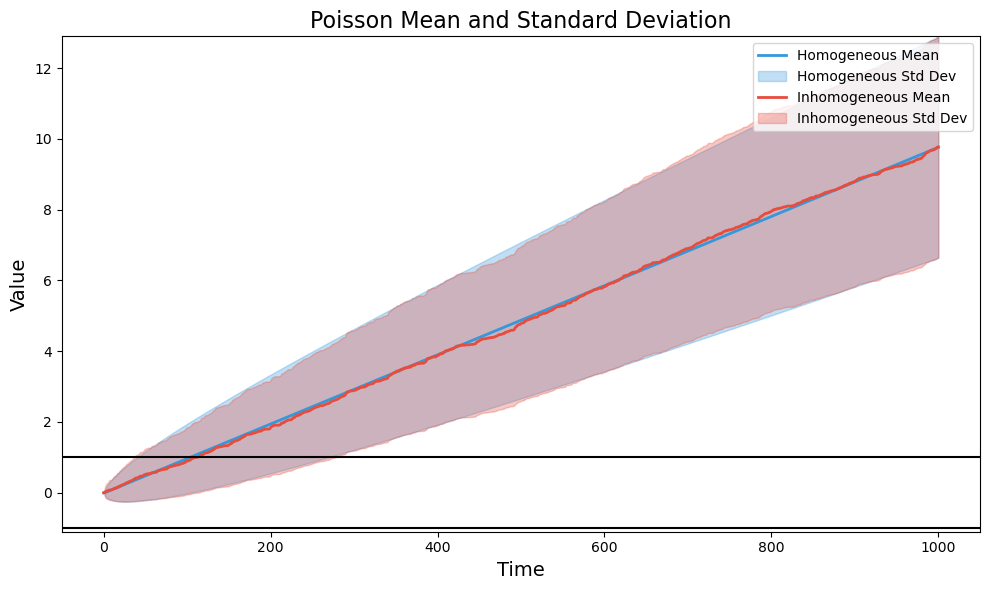

In [54]:
plot_stats(theoretical_means, empirical_mean, theoretical_std_dev, empirical_std_dev, title = 'Poisson Mean and Standard Deviation')

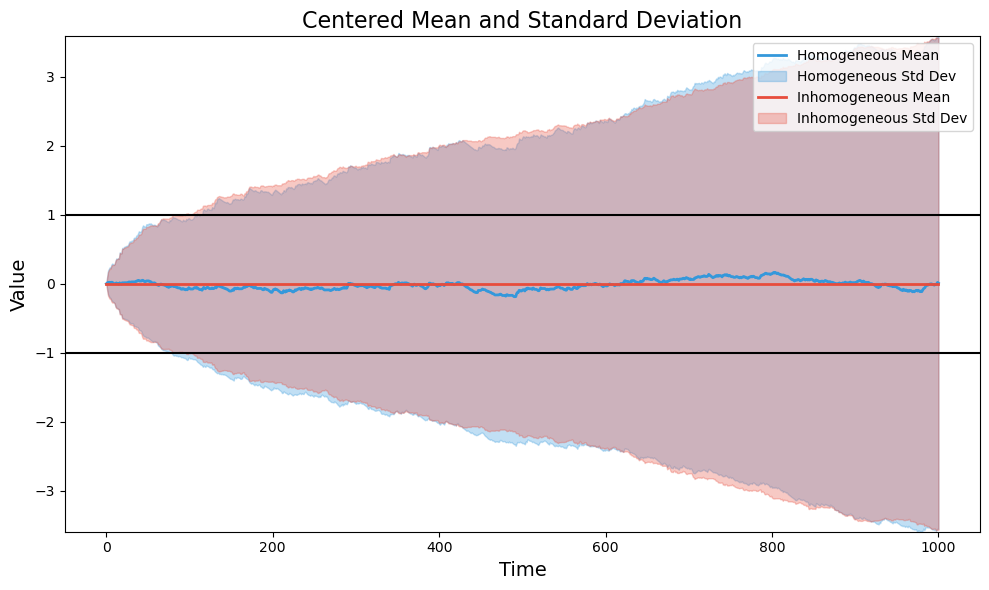

In [55]:
plot_stats(centers_mean, centers_mean_emp, centers_std_dev, centers_std_dev_emp, title = 'Centered Mean and Standard Deviation')

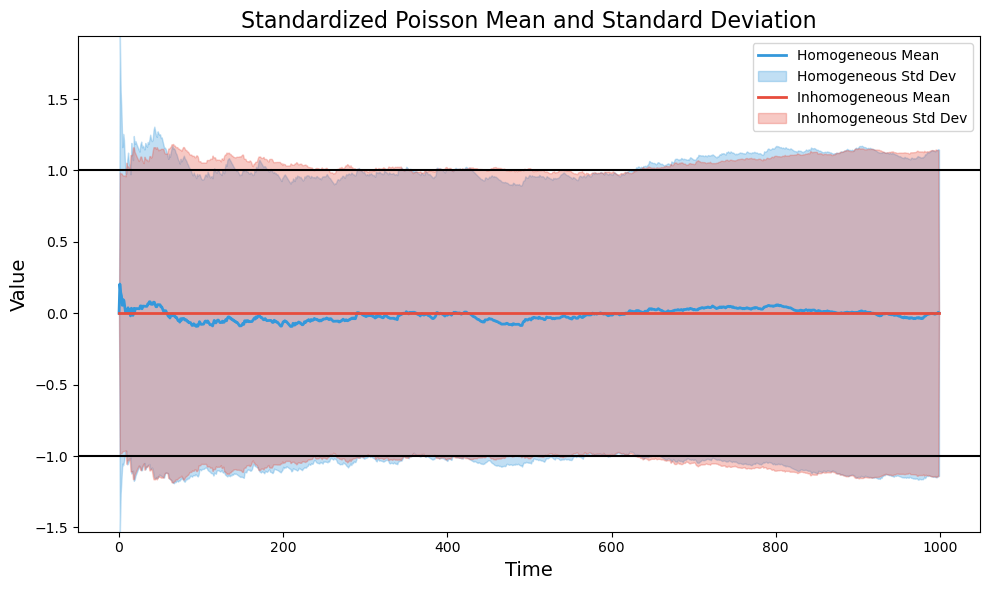

In [56]:
plot_stats(standardized_mean, standardized_mean_emp, standardized_std, standardized_std_emp, title = 'Standardized Poisson Mean and Standard Deviation')

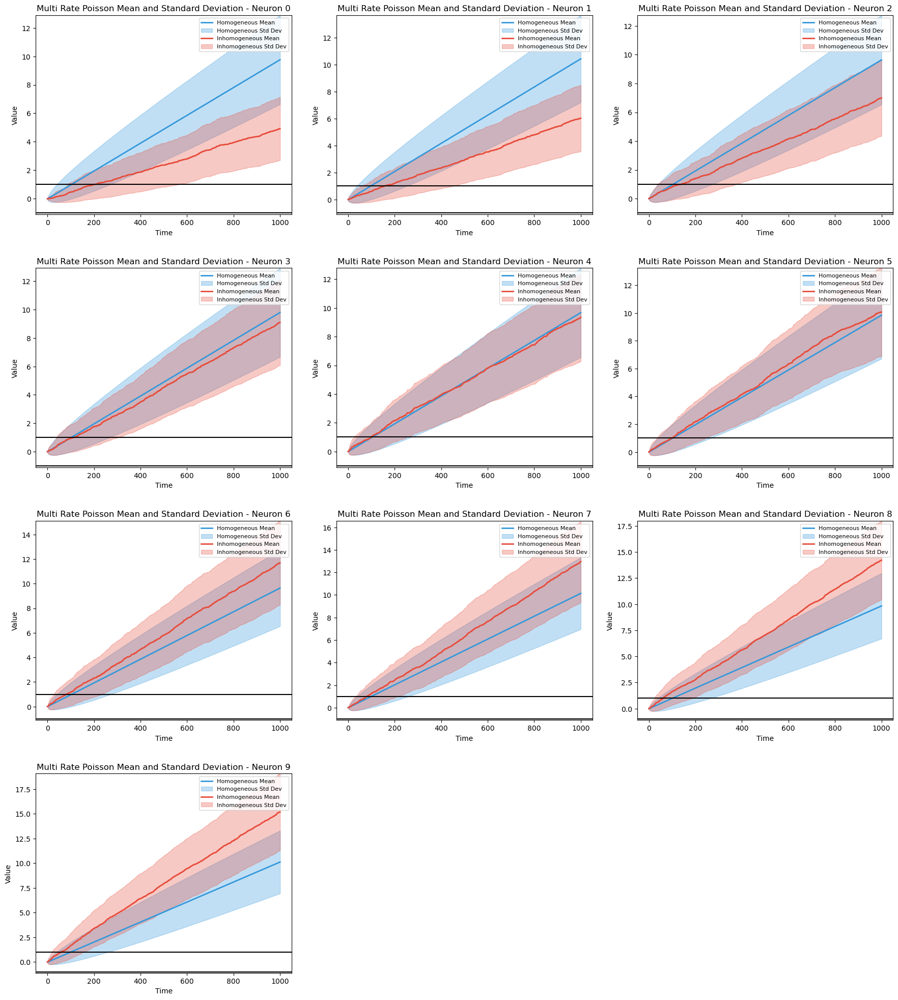

In [57]:
plot_multiple_stats(theoretical_means, multi_rate_empirical_mean, theoretical_std_dev, multi_rate_empirical_std_dev, title = 'Multi Rate Poisson Mean and Standard Deviation')
# plot_multiple_stats(multi_rate_theoretical_means, multi_rate_empirical_mean, multi_rate_theoretical_std_dev, multi_rate_empirical_std_dev, title = 'Multi Rate Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots. For more precise plots we can go with isoclines.
# Aka lines with fixed probabilities

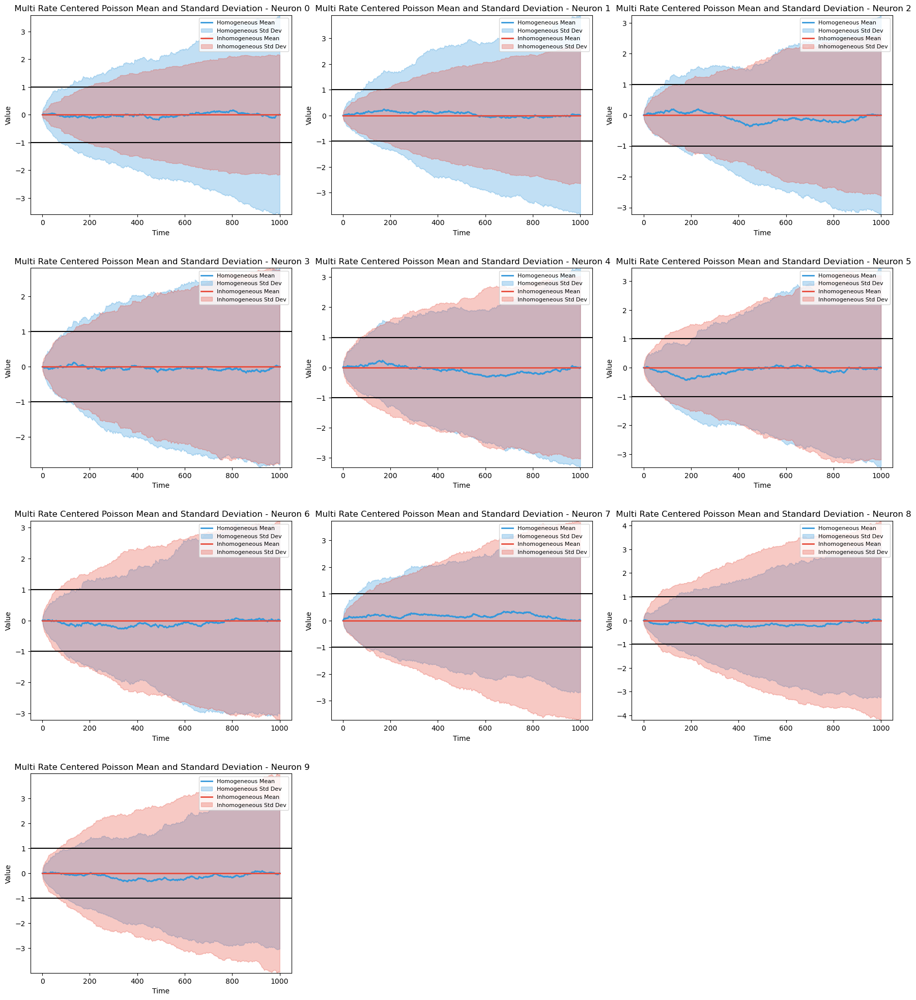

In [58]:
plot_multiple_stats(centers_mean, multi_rate_centers_mean_emp, centers_std_dev, multi_rate_centers_std_dev_emp, title = ' Multi Rate Centered Poisson Mean and Standard Deviation')
# plot_multiple_stats(multi_rate_centers_mean, multi_rate_centers_mean_emp, multi_rate_centers_std_dev, multi_rate_centers_std_dev_emp, title = ' Multi Rate Centered Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

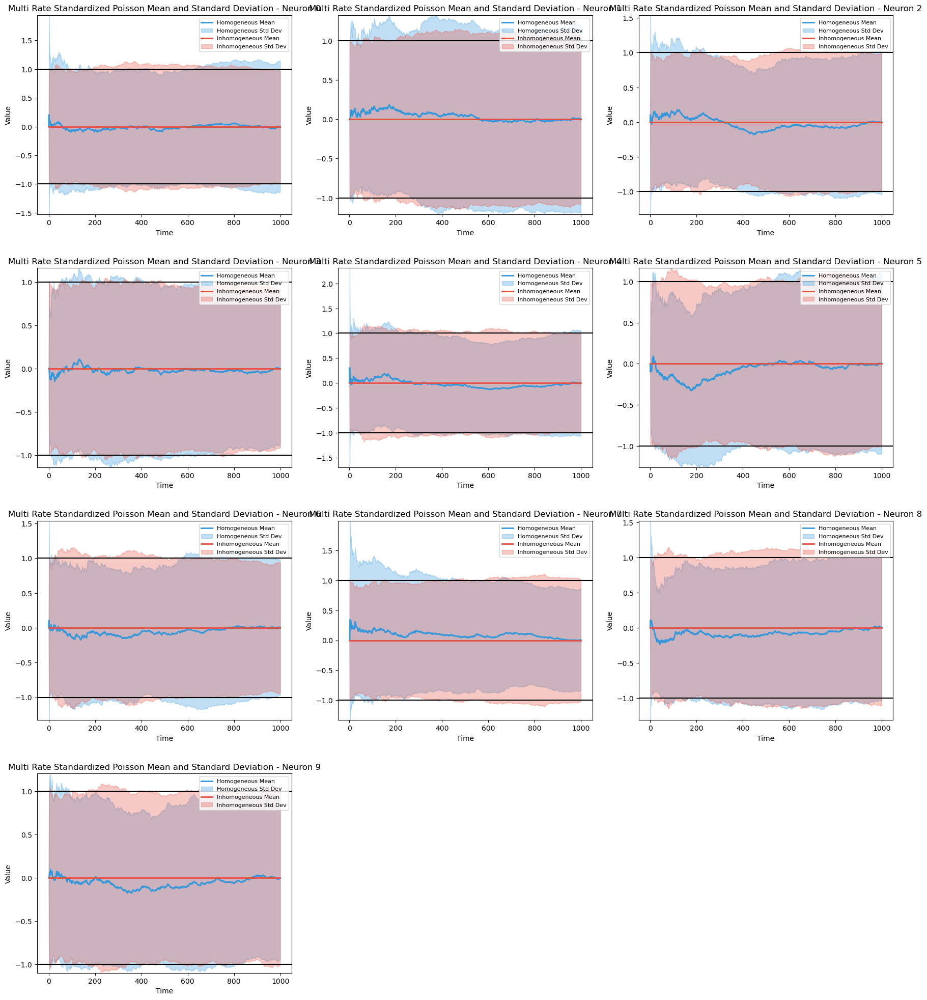

In [59]:
plot_multiple_stats(standardized_mean, multi_rate_standardized_mean_emp, standardized_std, multi_rate_standardized_std_emp, title = 'Multi Rate Standardized Poisson Mean and Standard Deviation')
# plot_multiple_stats(multi_rate_standardized_mean, multi_rate_standardized_mean_emp, multi_rate_standardized_std, multi_rate_standardized_std_emp, title = 'Multi Rate Standardized Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

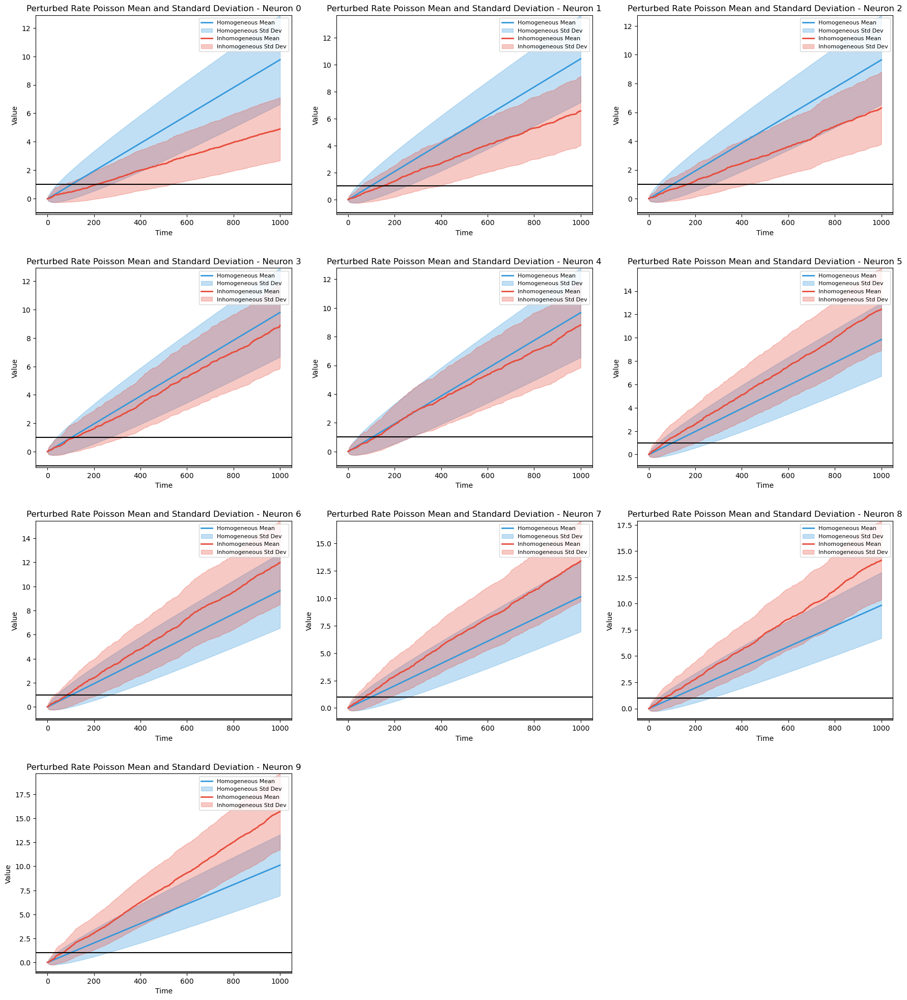

In [60]:
plot_multiple_stats(theoretical_means, perturbed_rate_empirical_mean, theoretical_std_dev, perturbed_rate_empirical_std_dev, title = 'Perturbed Rate Poisson Mean and Standard Deviation')
# plot_multiple_stats(perturbed_rate_theoretical_means, perturbed_rate_empirical_mean, perturbed_rate_theoretical_std_dev, perturbed_rate_empirical_std_dev, title = 'Perturbed Rate Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots. For more precise plots we can go with isoclines.
# Aka lines with fixed probabilities

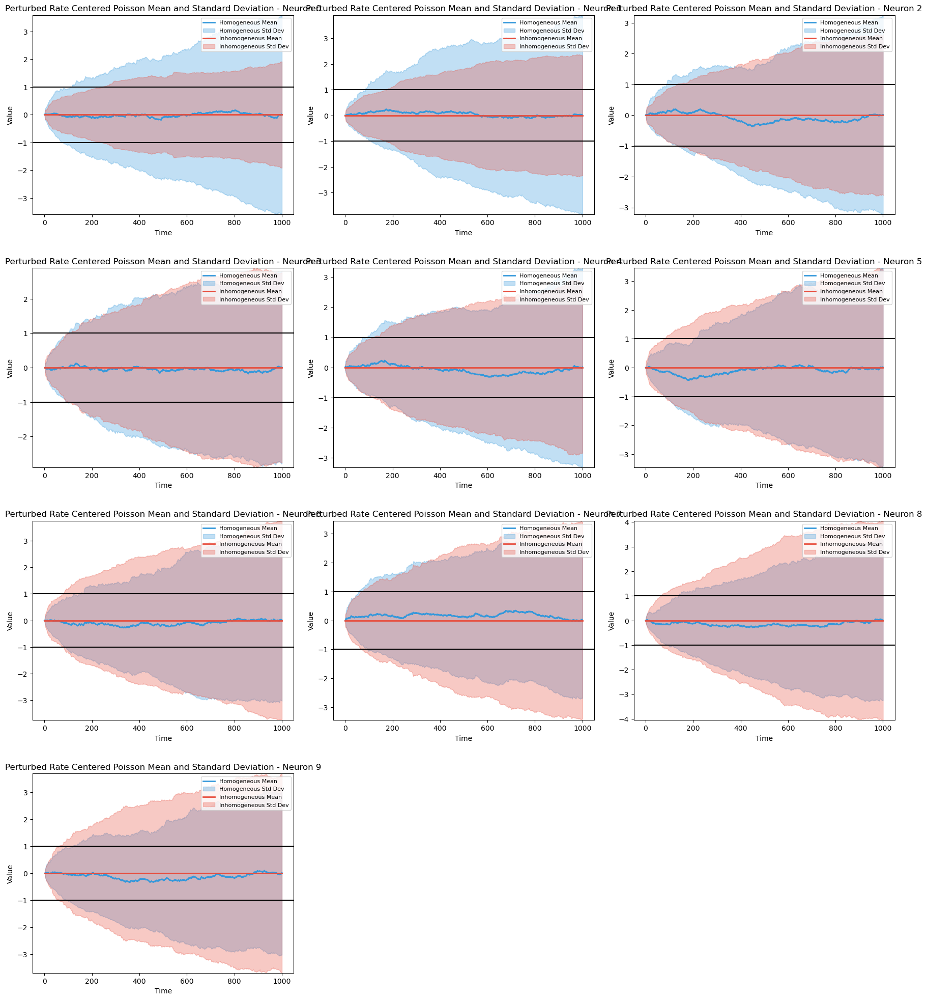

In [61]:
plot_multiple_stats(centers_mean, perturbed_rate_centers_mean_emp, centers_std_dev, perturbed_rate_centers_std_dev_emp, title = 'Perturbed Rate Centered Poisson Mean and Standard Deviation')
# plot_multiple_stats(perturbed_rate_centers_mean, perturbed_rate_centers_mean_emp, perturbed_rate_centers_std_dev, perturbed_rate_centers_std_dev_emp, title = 'Perturbed Rate Centered Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

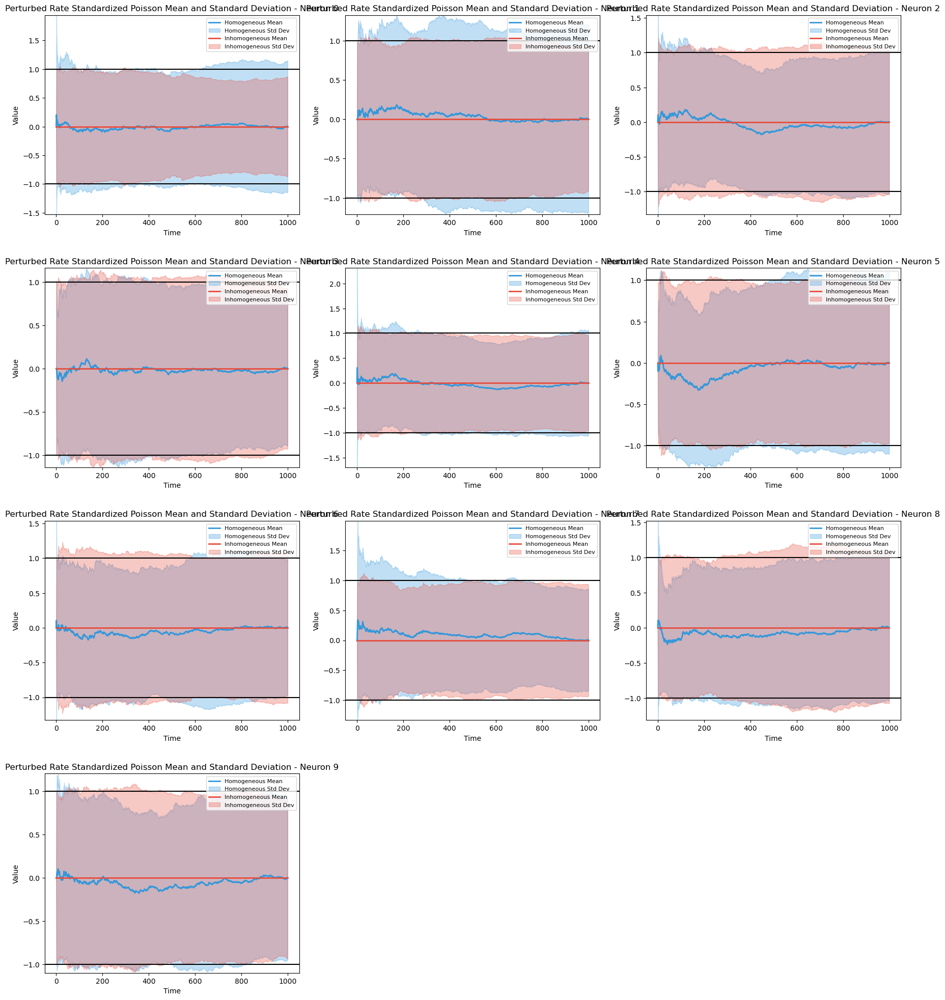

In [62]:
plot_multiple_stats(standardized_mean, perturbed_rate_standardized_mean_emp, standardized_std, perturbed_rate_standardized_std_emp, title = 'Perturbed Rate Standardized Poisson Mean and Standard Deviation')
# plot_multiple_stats(perturbed_rate_standardized_mean, perturbed_rate_standardized_mean_emp, perturbed_rate_standardized_std, perturbed_rate_standardized_std_emp, title = 'Perturbed Rate Standardized Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

In [63]:
mean_check = check_mean_with_se(stands, expected_mean=0, confidence=0.95)
#print(mean_check)

mean_check_emp = check_mean_with_se(stands_emp, expected_mean=0, confidence=0.95)
#print(mean_check_emp)

In [64]:
multi_rate_mean_check = check_mean_with_se(multi_rate_stands, expected_mean=0, confidence=0.95)
multi_rate_mean_check_emp = check_mean_with_se(multi_rate_stands_emp, expected_mean=0, confidence=0.95)

In [65]:
perturbed_rate_mean_check = check_mean_with_se(perturbed_rate_stands, expected_mean=0, confidence=0.95)
perturbed_rate_mean_check_emp = check_mean_with_se(perturbed_rate_stands_emp, expected_mean=0, confidence=0.95)

In [66]:
serialized_count = serialize_counts(stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count.shape)
#print(np.mean(serialized_count))
t_stat, p_val_mean = stats.ttest_1samp(serialized_count, np.mean(serialized_count))
#print(t_stat)
#print(p_val_mean)

    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables


serialized_count_emp = serialize_counts(stands_emp)
#print(serialized_count_emp.shape)
#print(np.mean(serialized_count_emp))
t_stat_emp, p_val_mean_emp = stats.ttest_1samp(serialized_count, np.mean(serialized_count))
#print(t_stat_emp)
#print(p_val_mean_emp)

In [67]:
multi_rate_serialized_count = serialize_counts(multi_rate_stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
multi_rate_t_stat, multi_rate_p_val_mean = stats.ttest_1samp(multi_rate_serialized_count, np.mean(multi_rate_serialized_count))

multi_rate_serialized_count_emp = serialize_counts(multi_rate_stands_emp)

multi_rate_t_stat_emp, multi_rate_p_val_mean_emp = stats.ttest_1samp(multi_rate_serialized_count_emp, np.mean(multi_rate_serialized_count_emp))

In [68]:
perturbed_rate_serialized_count = serialize_counts(perturbed_rate_stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
perturbed_rate_t_stat, perturbed_rate_p_val_mean = stats.ttest_1samp(perturbed_rate_serialized_count, np.mean(perturbed_rate_serialized_count))

perturbed_rate_serialized_count_emp = serialize_counts(perturbed_rate_stands_emp)

perturbed_rate_t_stat_emp, perturbed_rate_p_val_mean_emp = stats.ttest_1samp(perturbed_rate_serialized_count_emp, np.mean(perturbed_rate_serialized_count_emp))

In [69]:
#reshaped_stands = np.reshape(stands, (-1, stands.shape[1]), order='F')
# reshaped_stands = stands.transpose(1, 0, 2).reshape(stands.shape[1], -1)
reshaped_stands = np.transpose(stands, (1, 0, 2)).reshape(stands.shape[1], -1)
# transpose_stands = np.transpose(stands, (1, 0, 2))
#print(stands.shape)
#print(reshaped_stands.shape)

#reshaped_stands_emp = np.reshape(stands_emp, (-1, stands_emp.shape[1]), order='F')
# reshaped_stands_emp = stands.transpose(1, 0, 2).reshape(stands_emp.shape[1], -1)
reshaped_stands_emp = np.transpose(stands_emp, (1, 0, 2)).reshape(stands_emp.shape[1], -1)
#print(stands_emp.shape)
#print(reshaped_stands_emp.shape)

In [70]:
multi_rate_reshaped_stands = np.transpose(multi_rate_stands, (1, 0, 2)).reshape(multi_rate_stands.shape[1], -1)
multi_rate_reshaped_stands_emp = np.transpose(multi_rate_stands_emp, (1, 0, 2)).reshape(multi_rate_stands_emp.shape[1], -1)

In [71]:
perturbed_rate_reshaped_stands = np.transpose(perturbed_rate_stands, (1, 0, 2)).reshape(perturbed_rate_stands.shape[1], -1)
perturbed_rate_reshaped_stands_emp = np.transpose(perturbed_rate_stands_emp, (1, 0, 2)).reshape(perturbed_rate_stands_emp.shape[1], -1)

In [72]:
#print(transpose_stands.shape)
#print(transpose_stands[:,:,0])

In [73]:
#print(transpose_stands[:,:,0:3])

In [74]:
#print(reshaped_stands.shape)
#print(reshaped_stands[:,0])

In [75]:
#print(reshaped_stands[:,:5])

In [76]:
#### TESTING #####

In [77]:
test_stand = standardize_per_neuron(count, exclude=global_exclude)


=== Post-standardization checks (excluded t < 2 ) ===
Max |mean|: 1.492e-16 (should be close to 0)
Max |std - 1|: 2.220e-16 (should be close to 0)


In [78]:
#print(test_stand.shape)

In [79]:
cov_matrix = cov_standardized_data(reshaped_stands)
cov_matrix_emp = cov_standardized_data(reshaped_stands_emp)

In [80]:
multi_rate_cov_matrix = cov_standardized_data(multi_rate_reshaped_stands)
multi_rate_cov_matrix_emp = cov_standardized_data(multi_rate_reshaped_stands_emp)

In [81]:
perturbed_rate_cov_matrix = cov_standardized_data(perturbed_rate_reshaped_stands)
perturbed_rate_cov_matrix_emp = cov_standardized_data(perturbed_rate_reshaped_stands_emp)

array([[ 1.10382911e+00,  1.93121838e-02,  6.45666756e-02,
         1.23859092e-02, -3.54617254e-02,  3.38171799e-02,
        -5.24360741e-02, -5.30536977e-02,  1.57437903e-01,
         1.05322820e-01],
       [ 1.93121838e-02,  1.27644672e+00, -1.08310138e-01,
         3.92408563e-02,  8.19421405e-02, -2.34339946e-02,
         1.36584529e-01,  5.52440731e-02,  7.54046299e-03,
         1.12713079e-02],
       [ 6.45666756e-02, -1.08310138e-01,  9.31264287e-01,
         3.77025033e-02, -6.26338651e-03, -2.98135749e-02,
        -3.85985962e-02,  2.85065855e-03,  1.38365247e-02,
        -2.19814632e-02],
       [ 1.23859092e-02,  3.92408563e-02,  3.77025033e-02,
         9.47677916e-01, -6.90309845e-02,  9.96888478e-02,
        -1.39246323e-02,  7.75879063e-03,  2.24768386e-02,
         1.65773935e-01],
       [-3.54617254e-02,  8.19421405e-02, -6.26338651e-03,
        -6.90309845e-02,  9.74817189e-01, -6.99937027e-02,
         1.36503977e-01, -8.55643494e-03, -2.53104619e-02,
        -1.

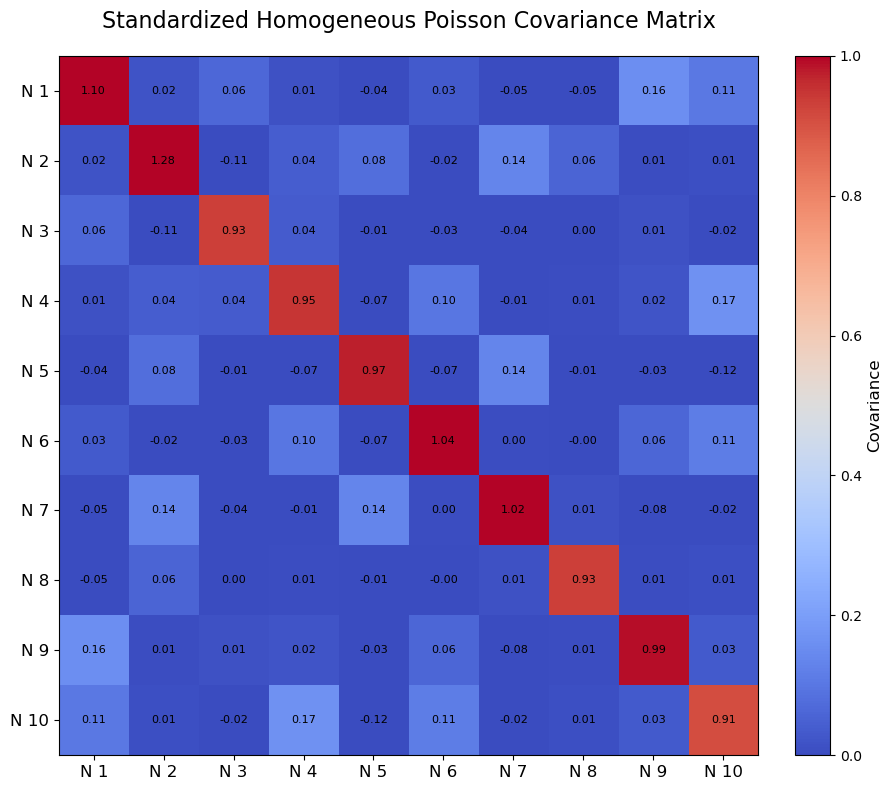

In [82]:
plot_covariance_matrix(cov_matrix, normalize=False, title='Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.1063116 ,  0.02011819,  0.06530412,  0.01287561, -0.03590168,
         0.03212085, -0.05560519, -0.04905179,  0.16158268,  0.10492282],
       [ 0.02011819,  1.23767106, -0.10928868,  0.03927104,  0.0784136 ,
        -0.01857321,  0.14120167,  0.04982915,  0.01213383,  0.01372688],
       [ 0.06530412, -0.10928868,  0.91670449,  0.03644909, -0.01258544,
        -0.02491782, -0.03948538,  0.00477177,  0.0134873 , -0.02505683],
       [ 0.01287561,  0.03927104,  0.03644909,  0.96298907, -0.07243983,
         0.10161469, -0.01519861,  0.01034847,  0.02002669,  0.16877698],
       [-0.03590168,  0.0784136 , -0.01258544, -0.07243983,  0.96078447,
        -0.06814573,  0.14035764, -0.01031433, -0.02773995, -0.12108082],
       [ 0.03212085, -0.01857321, -0.02491782,  0.10161469, -0.06814573,
         1.086289  , -0.00352213,  0.00718789,  0.05303171,  0.11665022],
       [-0.05560519,  0.14120167, -0.03948538, -0.01519861,  0.14035764,
        -0.00352213,  1.04662705,  0.02136054

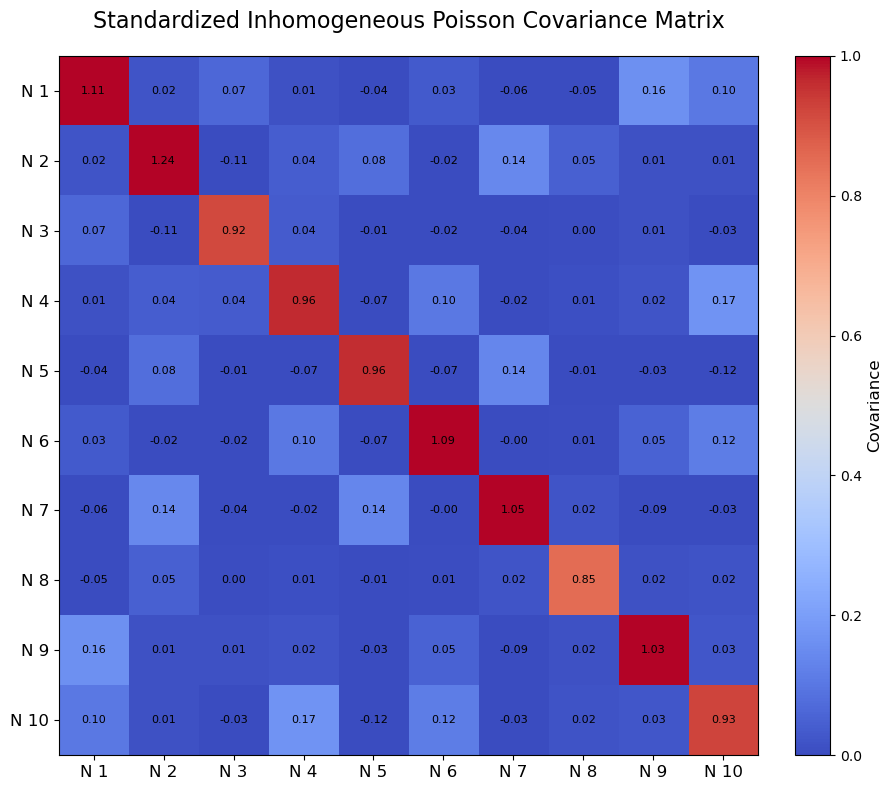

In [83]:
plot_covariance_matrix(cov_matrix_emp, normalize=False, title='Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.76250817,  1.05929035,  0.77023097,  0.11440328, -0.0101294 ,
        -0.17088933, -0.44182462, -0.65358707, -1.1729862 , -1.39645448],
       [ 1.05929035,  1.61212254,  0.612258  ,  0.17844004, -0.11132997,
        -0.02536145, -0.50749909, -0.58514545, -1.00660543, -1.20597451],
       [ 0.77023097,  0.612258  ,  1.08633401,  0.19495977,  0.06958565,
        -0.12956291, -0.23954857, -0.31554471, -0.53480765, -0.82640459],
       [ 0.11440328,  0.17844004,  0.19495977,  0.89058117,  0.17761603,
        -0.04723458, -0.14668758, -0.10887672, -0.06190123, -0.19435263],
       [-0.0101294 , -0.11132997,  0.06958565,  0.17761603,  1.13817686,
         0.03157507, -0.08353354, -0.01131612, -0.03666389,  0.05968345],
       [-0.17088933, -0.02536145, -0.12956291, -0.04723458,  0.03157507,
         1.153022  ,  0.04513203,  0.0420714 ,  0.2580092 ,  0.119232  ],
       [-0.44182462, -0.50749909, -0.23954857, -0.14668758, -0.08353354,
         0.04513203,  1.49386056,  0.20978229

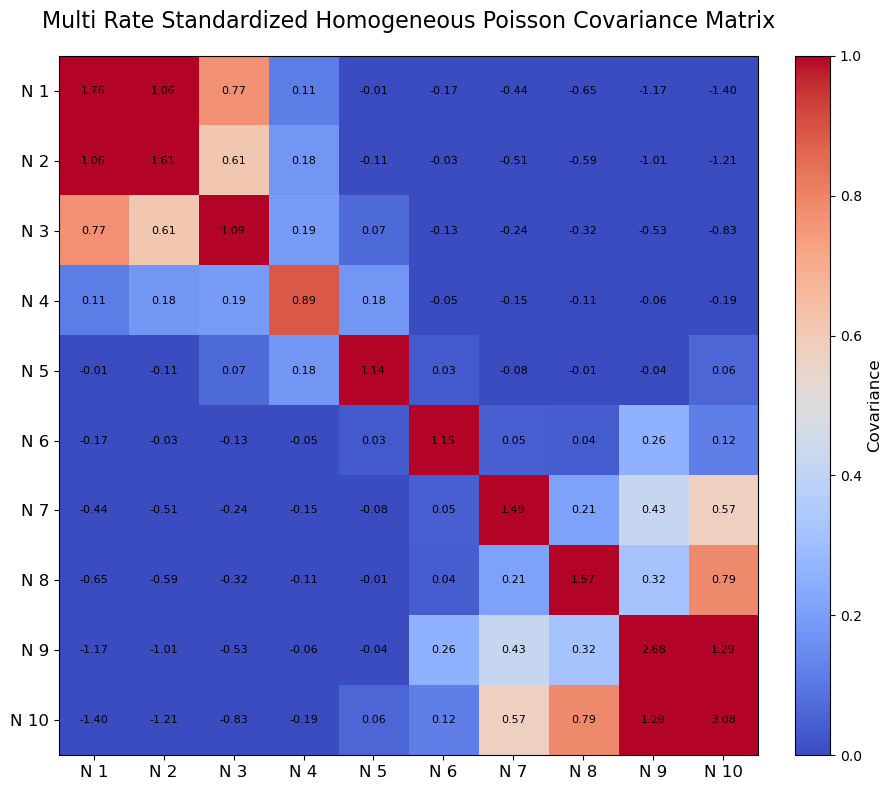

In [84]:
plot_covariance_matrix(multi_rate_cov_matrix, normalize=False, title='Multi Rate Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.08139442e+00, -3.72860803e-02,  1.45486253e-01,
        -1.21879828e-01, -3.13917290e-02, -1.64778648e-02,
         1.12153782e-01, -2.49130249e-02, -8.06448192e-02,
        -3.25809869e-02],
       [-3.72860803e-02,  1.14295438e+00,  2.25302482e-02,
         1.06706314e-02, -1.60216810e-01,  1.43409907e-01,
        -5.71553961e-02, -3.77292561e-02, -4.80047067e-02,
        -1.40013519e-02],
       [ 1.45486253e-01,  2.25302482e-02,  9.52022882e-01,
         1.06935530e-01,  7.01562967e-02, -4.63658669e-02,
         5.26503089e-02,  3.72801780e-02,  7.45010230e-02,
        -6.74369778e-02],
       [-1.21879828e-01,  1.06706314e-02,  1.06935530e-01,
         9.31878062e-01,  1.83813208e-01, -2.32283824e-02,
        -5.96755208e-02, -7.48384543e-03,  9.78221695e-02,
         1.84193166e-02],
       [-3.13917290e-02, -1.60216810e-01,  7.01562967e-02,
         1.83813208e-01,  1.08235871e+00,  3.10611605e-02,
        -7.24982128e-02, -6.11499249e-04, -2.35627989e-02,
         5.

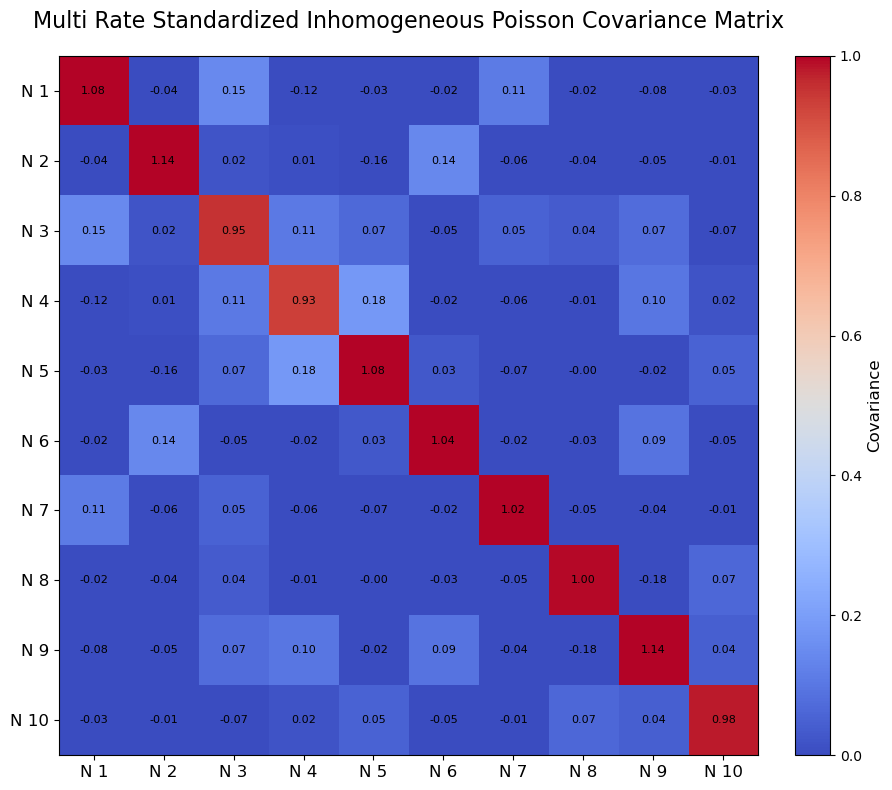

In [85]:
plot_covariance_matrix(multi_rate_cov_matrix_emp, normalize=False, title='Multi Rate Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.61268311,  0.91830125,  0.9090017 ,  0.30567092,  0.23886504,
        -0.65868835, -0.58130235, -0.89549111, -1.15547939, -1.32215565],
       [ 0.91830125,  1.3072007 ,  0.74306601,  0.18754736,  0.21651576,
        -0.51230213, -0.42258572, -0.78676196, -0.79142092, -1.04688268],
       [ 0.9090017 ,  0.74306601,  1.36354193,  0.150873  ,  0.12505726,
        -0.52157572, -0.34058847, -0.64775924, -0.81425686, -0.99457705],
       [ 0.30567092,  0.18754736,  0.150873  ,  1.00801237,  0.01281709,
        -0.22344285, -0.18347362, -0.10850425, -0.12947953, -0.44518142],
       [ 0.23886504,  0.21651576,  0.12505726,  0.01281709,  0.91360621,
        -0.02412568,  0.04318346, -0.20394474, -0.09660115, -0.14387342],
       [-0.65868835, -0.51230213, -0.52157572, -0.22344285, -0.02412568,
         1.6778737 ,  0.48585502,  0.51993842,  0.65034045,  0.76544315],
       [-0.58130235, -0.42258572, -0.34058847, -0.18347362,  0.04318346,
         0.48585502,  1.72112278,  0.21766355

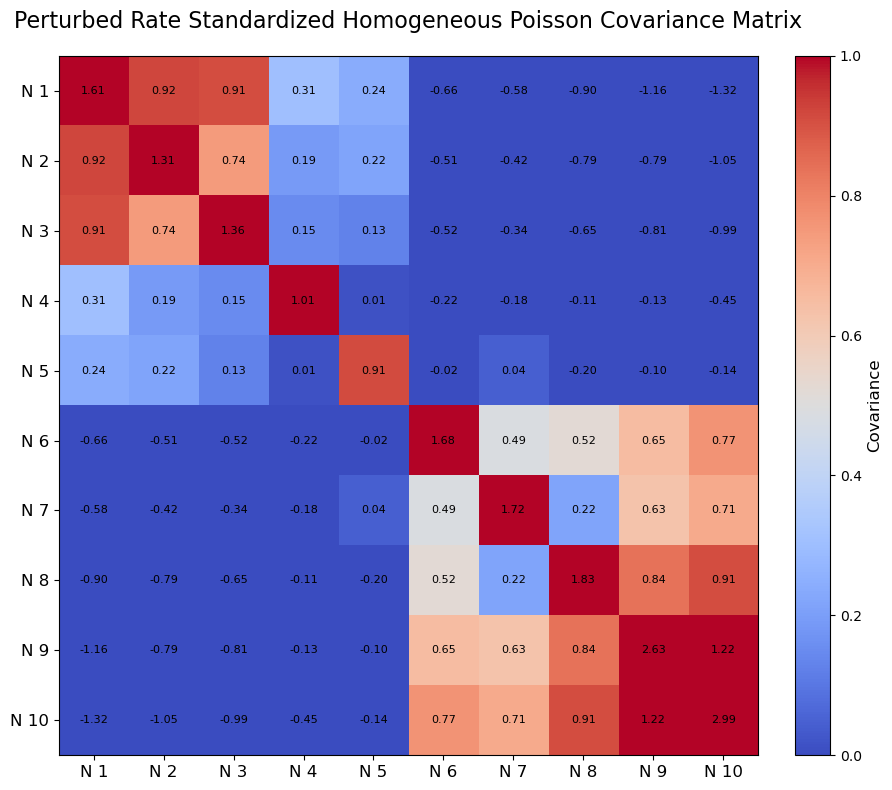

In [86]:
plot_covariance_matrix(perturbed_rate_cov_matrix, normalize=False, title='Perturbed Rate Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 0.80406009,  0.03964931,  0.07112284,  0.04280063,  0.06505174,
         0.03869279,  0.02875242, -0.06597852, -0.09901306,  0.01376286],
       [ 0.03964931,  0.96655456,  0.14486855, -0.02492226,  0.08964584,
         0.00527169,  0.03091992, -0.16857306,  0.01227724, -0.04761861],
       [ 0.07112284,  0.14486855,  1.13741692, -0.06741265, -0.02043978,
        -0.02145991,  0.1116189 , -0.03996423, -0.03779308, -0.02690549],
       [ 0.04280063, -0.02492226, -0.06741265,  1.06866099, -0.03329022,
        -0.05686299, -0.0405844 ,  0.08277899,  0.1052854 , -0.11709268],
       [ 0.06505174,  0.08964584, -0.02043978, -0.03329022,  0.94615027,
         0.07861177,  0.13136152, -0.06215888,  0.06871716,  0.06254248],
       [ 0.03869279,  0.00527169, -0.02145991, -0.05686299,  0.07861177,
         0.95732845,  0.10616992,  0.0229064 ,  0.01932456, -0.00325976],
       [ 0.02875242,  0.03091992,  0.1116189 , -0.0405844 ,  0.13136152,
         0.10616992,  1.1178327 , -0.16160439

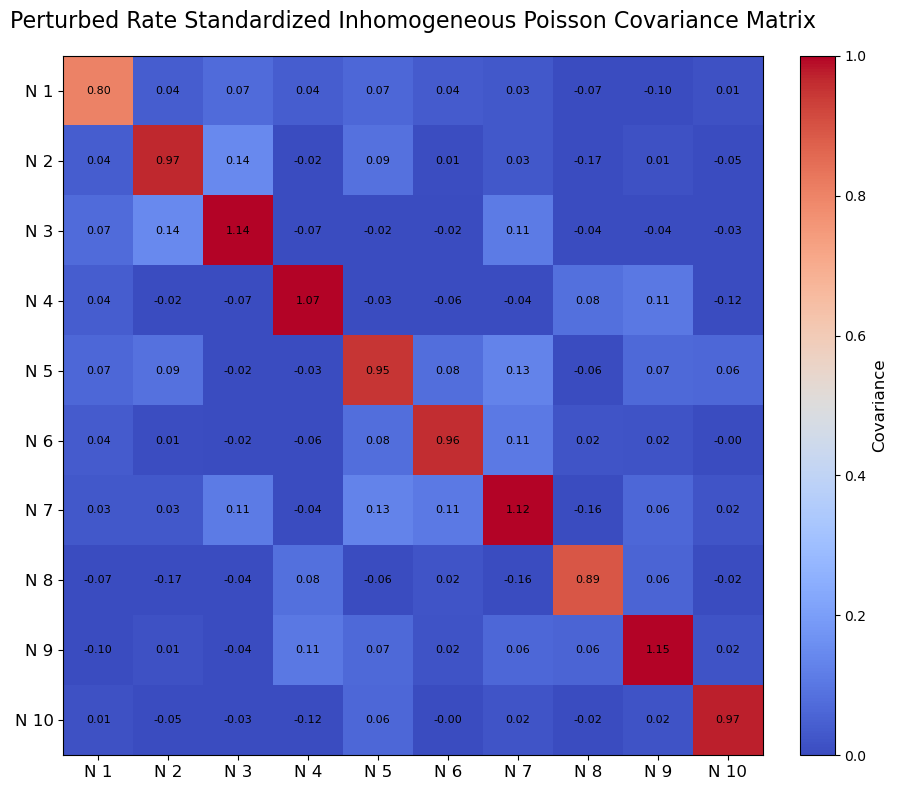

In [87]:
plot_covariance_matrix(perturbed_rate_cov_matrix_emp, normalize=False, title='Perturbed Rate Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

In [88]:
#### TESTING END #####

In [89]:
#hotelling_result = hotelling_t2_test(reshaped_stands, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result)
#hotelling_result_emp = hotelling_t2_test(reshaped_stands_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_emp)

In [90]:
#good_result = stats.goodness_of_fit(stats.norm, serialized_count, statistic='ad', n_mc_samples=9999, rng=None)
# Anderson-Darling test (good for normality)
# Number of Monte Carlo samples
# Random number generator (None for fresh results)

#print(f"Statistic: {good_result.statistic}")
#print(f"P-value: {good_result.pvalue}")
#print(f"Location (mean): {good_result.fit_result.params.loc}")
#print(f"Scale (std dev): {good_result.fit_result.params.scale}")

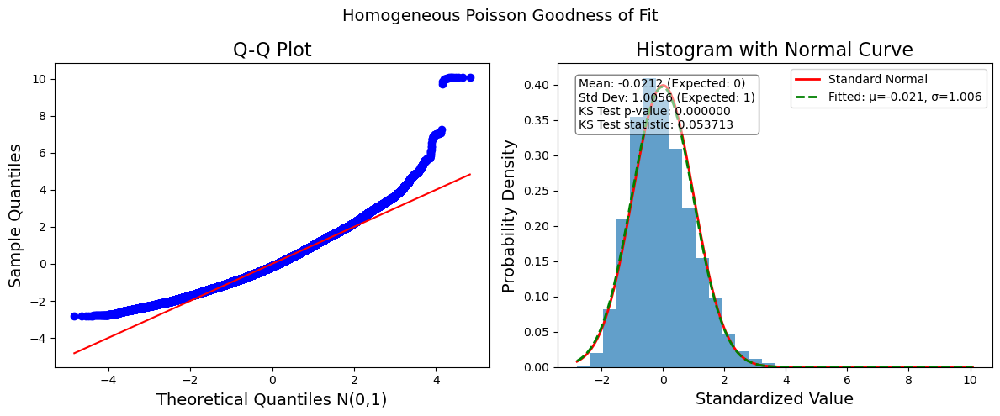

In [91]:
goodness, fig = analyze_poisson_goodness_of_fit(serialized_count, plot_title="Homogeneous Poisson Goodness of Fit", sample_limit=5000)

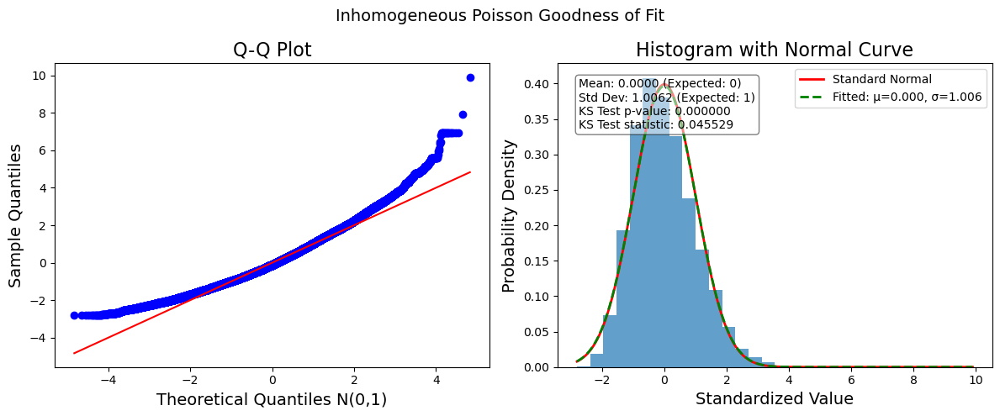

In [92]:
goodness_emp, fig_emp = analyze_poisson_goodness_of_fit(serialized_count_emp, plot_title="Inhomogeneous Poisson Goodness of Fit", sample_limit=5000)

In [93]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)
#rv = multivariate_normal(mean = [0,0], cov = cov_matrix, allow_singular = False)
#rv_emp = multivariate_normal(mean = [0,0], cov = cov_matrix_emp, allow_singular=False)
#print(rv)
#print(rv_emp)

# this is creating its own model, from this we can test if the data has goodness of fit

In [94]:
#cov_matrix, diagonal_ones = covariance_diagonal(reshaped_stands, tol=1e-8)
#print(cov_matrix)
#print(diagonal_ones)
#cov_matrix_emp, diagonal_ones_emp = covariance_diagonal(reshaped_stands_emp, tol=1e-8)
#print(cov_matrix_emp)
#print(diagonal_ones_emp)

In [95]:
#normal_loglikelihood = compute_neural_multivariate_log_likelihood(reshaped_stands)
#print(normal_loglikelihood)

#normal_loglikelihood_emp = compute_neural_multivariate_log_likelihood(reshaped_stands_emp)
#print(normal_loglikelihood_emp)

LogLikelihood experiments, Chi Square statistics, T tests, and zscores

In [97]:
total_log_likelihood, log_likelihood_per_sample = log_likelihood(empirical_mean, theoretical_means)
print(total_log_likelihood)
print(log_likelihood_per_sample)
# normalize data first (so we don't have any negative values, then we can do log likelihood)

#The neural spike patterns that are observed are unlikely to have come from the model...I got around -1600 log likelihood...

-16065.836806904452
[-1599.48885667 -1647.89701575 -1600.51628896 -1599.38302815
 -1601.12038452 -1587.32783897 -1583.24253941 -1652.37548388
 -1585.88056025 -1608.60481034]


In [98]:
test_total_log_likelihood, test_log_likelihood_per_sample = log_likelihood(theoretical_means, theoretical_means)
print(test_total_log_likelihood)
print(test_log_likelihood_per_sample)
# Note: This log likelihood has relative entropy
## Why the log likelihood per sample is different, the data is stochastic! ##
# we are doing this : log_likelihood = k*log(k) - k - log(k!) , so k = λ
#                o.g. log likelihood = k*log(λ) - λ - log(k!)
# even a perfect match is going to vary per sample because each sample is stochastic #

-16082.696456433794
[-1602.46151312 -1632.8106509  -1596.73704089 -1604.35499371
 -1598.17440306 -1606.24123013 -1596.73704089 -1620.16260047
 -1605.77034712 -1619.24663614]


In [99]:
multivar_log_likelihood, multivar_log_likelihood_per_sample = multivariate_log_likelihood(reshaped_stands)
print(multivar_log_likelihood)
print(multivar_log_likelihood_per_sample)
len(multivar_log_likelihood_per_sample)

# note, there are 99900 samples and the total sum of those is very large.
#print(multivar_log_likelihood/len(multivar_log_likelihood_per_sample))

-1411609.2382543792
[ -9.17468923 -28.00262739 -21.57354083 ... -11.75486727 -11.76070277
 -11.7666155 ]


99900

In [100]:
multivar_log_likelihood_emp, multivar_log_likelihood_per_sample_emp = multivariate_log_likelihood(reshaped_stands_emp)
print(multivar_log_likelihood_emp)
print(multivar_log_likelihood_per_sample_emp)
len(multivar_log_likelihood_per_sample)

reshaped_stands_emp.shape

-1410133.340564956
[-29.57596345 -22.65876697 -17.06289013 ... -11.73656213 -11.7439161
 -11.74457067]


(10, 99800)

In [101]:
## Multivariate LogLikelihood with zero vector of len(num_neurons), aka 10) ##
multivar_log_likelihood_emp, multivar_log_likelihood_per_sample_emp = multivariate_log_likelihood(np.zeros(reshaped_stands_emp.shape))
print(multivar_log_likelihood_emp)
print(multivar_log_likelihood_per_sample_emp)
len(multivar_log_likelihood_per_sample)

5976839.112285911
[59.88816746 59.88816746 59.88816746 ... 59.88816746 59.88816746
 59.88816746]


99900

In [102]:
# difference between multivariate log likelihood of expected - observed data.
diff = multivar_log_likelihood_emp - multivar_log_likelihood
print(diff)

print(diff/len(multivar_log_likelihood_per_sample)) # small difference per sample, less than 1.

7388448.350540291
73.95844194735025


In [103]:
reshaped_stands_resized, reshaped_stands_emp_resized = match_array_shapes(reshaped_stands, reshaped_stands_emp)
# resized makes sure that the standardized observed and expected data are the same shape

Original shapes: (10, 99900) and (10, 99800)
Trimmed both to shape: (10, 99800)
Final shapes: (10, 99800) and (10, 99800)


In [104]:
### Chi square test can have bins and minimum expected input by the user ###
### bins (resolution): more bins show a detailed comparison, fewer bins show a broader comparison ###
### min_expected: check used to empty bins with less than min_expected counts
### 50 bins is considered a moderate resolution, 5 minimum expected counts per bin

In [105]:
proper_chi_square_test(reshaped_stands_resized, reshaped_stands_emp_resized, n_bins=30, min_expected=5)
# 'chi_square_statistic': 244.68781663684993
# 'p_value': 4.777468454985577e-40 (aka statistically significant p < 0.05)
# 'degrees_of_freedom': 21, (22 - 1 = 21)
# 'bins_created': 30
# 'bins_used': 22
# 'bins_removed': 8 (too few expected counts)
# The frequency distributions of observed and expected standardized data are different

{'chi_square_statistic': 617.1805057510877,
 'p_value': 6.893568382729516e-118,
 'degrees_of_freedom': 20,
 'bins_created': 30,
 'bins_used': 21,
 'bins_removed': 9}

In [106]:
### T test can have 'one_sample', 'two_sample', or 'paired' test type ###

In [107]:
t_test(reshaped_stands_resized, reshaped_stands_emp_resized, test_type='one_sample', target_mean=0)
# 't_statistic': 2.9680692646417373
# 'p_value': 0.00299683895859134
# 'target_mean': 0.0
# 'sample_mean': 0.003010765946416713

## estimated standardized data compared with the estimated mean.

{'t_statistic': -20.810587143825057,
 'p_value': 3.6383781572101367e-96,
 'test_type': 'one_sample_vs_mean',
 'target_mean': 0.0,
 'sample_mean': -0.020953299212932545}

In [108]:
t_test(reshaped_stands_emp_resized, reshaped_stands_emp_resized, test_type='one_sample', target_mean=0)
# 't_statistic': 9.031514925174204e-16
# 'p_value': 0.9999999999999993
# 'target_mean': 0.0
# ''sample_mean': 9.10405106879808e-19

## observed standardized data compared with the known mean.

{'t_statistic': -4.524039170873979e-16,
 'p_value': 0.9999999999999996,
 'test_type': 'one_sample_vs_mean',
 'target_mean': 0.0,
 'sample_mean': -4.556586682229099e-19}

In [109]:
### Z stat info ###
data_flat = reshaped_stands_emp.flatten()
n = len(data_flat)

sample_std = np.std(data_flat, ddof=1)
std_error = sample_std / np.sqrt(n)
std_error

np.float64(0.0010071943478218894)

In [110]:
# z_stat = (sample_mean - population_mean) / std_error
Zstat = (np.mean(reshaped_stands_emp) - 0)/std_error
Zstat

np.float64(-4.524039170873979e-16)

In [111]:
t_test(reshaped_stands_resized, reshaped_stands_emp_resized, test_type='two_sample', target_mean=None)
# Are the group means different?
# 't_statistic': 2.1053251974447873
# 'p_value': 0.03526313467995148 (aka statistically significant p < 0.05)
# The datasets have significantly different means

{'t_statistic': -14.712847184014771,
 'p_value': 5.363282902492059e-49,
 'test_type': 'two_sample'}

In [112]:
t_test(reshaped_stands_resized, reshaped_stands_emp_resized, test_type='paired', target_mean=None)
# Are the paired differences different from zero
# 't_statistic': 36.627117732234396
# 'p_value': 1.6617750264560706e-293 (aka statistically significant p < 0.05)
# The datasets have significantly paired differences

{'t_statistic': -40.162344506555556, 'p_value': 0.0, 'test_type': 'paired'}

Theoretical and Empirical stats of excitatory counts.

In [114]:
# empirical_mean_ex = empirical_means(count_ex)
empirical_mean_ex = count_ex.mean(axis=0)
#print(empirical_mean_ex)
#print(empirical_mean_ex.shape)
count_rate_ex = empirical_mean_ex[:, -1]

# empirical_std_dev_ex = std_dev_empirical_mean(empirical_mean_ex, num_samples, count_ex)
#empirical_std_dev_ex = count_ex.std(axis=0, ddof=1)
empirical_std_dev_ex = np.sqrt(empirical_mean_ex)
#print(empirical_std_dev_ex)
#print(empirical_std_dev_ex.shape)

empirical_lower_bound_ex, empirical_upper_bound_ex = confidence_intervals(empirical_mean_ex, empirical_std_dev_ex, num_samples, confidence_level=0.95)
# print(empirical_lower_bound_sim_ex)
# print(empirical_upper_bound_sim_ex)

In [115]:
exclude_times_ex, global_exclude_ex = last_zero_std_time(empirical_std_dev_ex, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=0


In [116]:
theoretical_means_sim_ex = calculate_theoretical_mean(count_rate_ex, time)
#print(theoretical_means_sim_ex)
#print(theoretical_means_sim_ex.shape)

theoretical_std_dev_sim_ex = calculate_theoretical_std_dev(theoretical_means_sim_ex)
#print(theoretical_std_dev_sim_ex)
#print(theoretical_std_dev_sim_ex.shape)

theoretical_lower_bound_sim_ex, theoretical_upper_bound_sim_ex = confidence_intervals(theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound_sim_ex)
# print(theoretical_upper_bound_sim_ex)

In [117]:
res_var_ex = variance_of_residuals(empirical_mean_ex, theoretical_means_sim_ex)
#print(res_var_ex)

In [118]:
stands_ex = standardize_counts_loop(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, num_neurons, exclude = 1)
#print(stands_ex)
#print(stands_ex.shape)

stands_ex_emp = standardize_counts_loop(count_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples, num_neurons, global_exclude_ex)
#print(stands_ex_emp)
#print(stands_ex_emp.shape)

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global_ex = np.mean(stands_ex)
standardized_std_global_ex = np.std(stands_ex)

standardized_mean_emp_global_ex = np.mean(stands_ex_emp)
standardized_std_emp_global_ex = np.std(stands_ex_emp)

standardized_mean_ex = np.mean(stands_ex, axis=0)
standardized_std_ex = np.std(stands_ex, axis=0, ddof = 1)

standardized_mean_ex_emp = np.mean(stands_ex_emp, axis = 0)
standardized_std_ex_emp = np.std(stands_ex_emp, axis = 0, ddof = 1)

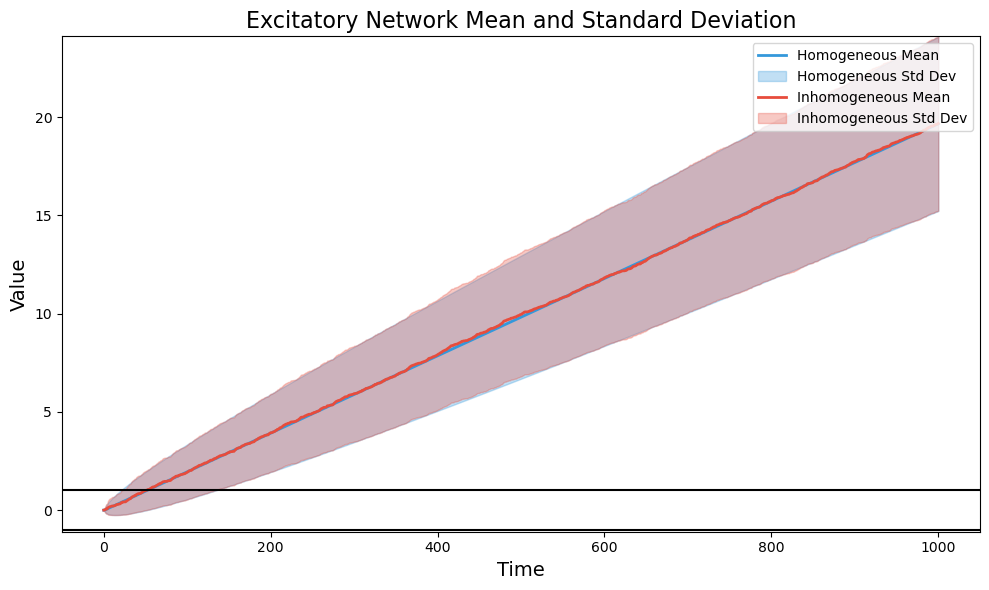

In [119]:
plot_stats(theoretical_means_sim_ex, empirical_mean_ex, theoretical_std_dev_sim_ex, empirical_std_dev_ex, title = 'Excitatory Network Mean and Standard Deviation')

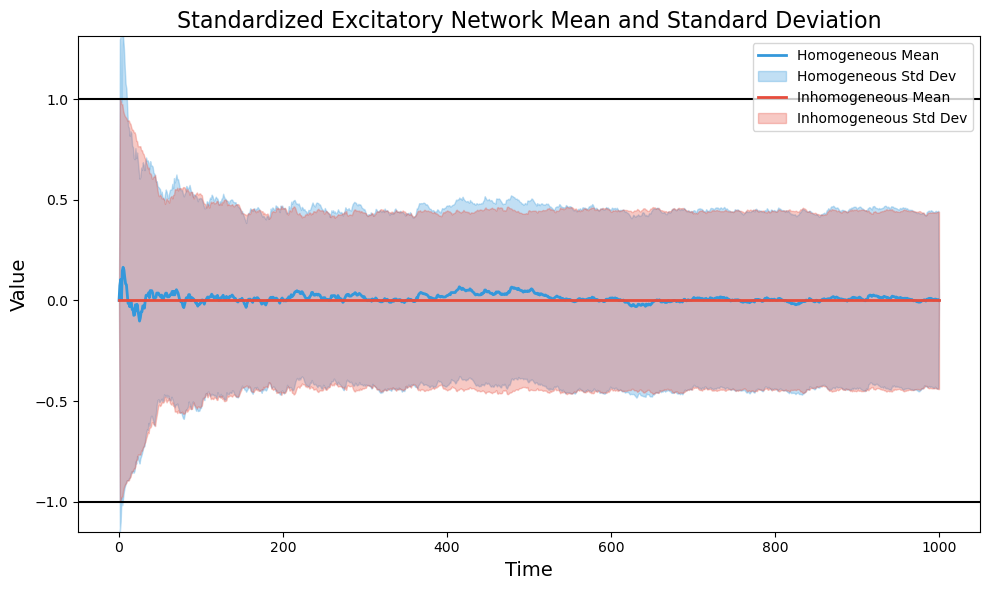

In [120]:
plot_stats(standardized_mean_ex, standardized_mean_ex_emp, standardized_std_ex, standardized_std_ex_emp, title = 'Standardized Excitatory Network Mean and Standard Deviation')

In [121]:
mean_check_ex = check_mean_with_se(stands_ex, expected_mean=0, confidence=0.95)
#print(mean_check_ex)

mean_check_ex_emp = check_mean_with_se(stands_ex_emp, expected_mean=0, confidence=0.95)
#print(mean_check_ex_emp)

In [122]:
serialized_count_ex = serialize_counts(stands_ex) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_ex.shape)
#print(np.mean(serialized_count_ex))
t_stat_ex, p_val_mean_ex = stats.ttest_1samp(serialized_count_ex, np.mean(serialized_count_ex))
#print(t_stat_ex)
#print(p_val_mean_ex)

    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables

serialized_count_ex_emp = serialize_counts(stands_ex_emp) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_ex_emp.shape)
#print(np.mean(serialized_count_ex_emp))
t_stat_ex_emp, p_val_mean_ex_emp = stats.ttest_1samp(serialized_count_ex_emp, np.mean(serialized_count_ex_emp))
#print(t_stat_ex_emp)
#print(p_val_mean_ex_emp)

In [123]:
#reshaped_stands_ex = np.reshape(stands_ex, (-1, stands_ex.shape[1]), order='F')
reshaped_stands_ex = np.transpose(stands_ex, (1, 0, 2)).reshape(stands_ex.shape[1], -1)
#print(stands_ex.shape)
#print(reshaped_stands_ex.shape)

#could change the values from num_samples, num_neurons, time to 10 by large number, could transpose it
# make sure coviariance matrix is using row data, don't use np.cov because it throws away the mean
# covariance is the data and the transpose of the data divided sqrt(n-1), lookup how covariance is calculated and make it by hand.
# try to iterate over samples, as in each time point, 

# reshaped_stands_ex_emp = np.reshape(stands_ex_emp, (-1, stands_ex_emp.shape[1]), order='F')
reshaped_stands_ex_emp = np.transpose(stands_ex_emp, (1, 0, 2)).reshape(stands_ex_emp.shape[1], -1)
#print(stands_ex_emp.shape)
#print(stands_ex.shape)
#print(reshaped_stands_ex.shape)
#print(stands_ex[:,:,0])
#print(reshaped_stands[:,0])
#print(stands_ex_emp[:,:,0].shape)
#print(stands_ex_emp[:10,:,0])
#print(reshaped_stands_ex_emp.shape)
#print(reshaped_stands_ex_emp[:10,:])

In [124]:
transpose_stands_ex = np.transpose(stands_ex, (1, 0, 2))
#print(transpose_stands_ex[:,:,0:3])

In [125]:
#print(reshaped_stands_ex[:,:5])

In [126]:
#print("Time point 0:", stands_ex[:,:,0])
#print("Time point 1:", stands_ex[:,:,1])
#print("Time point 100:", stands_ex[:,:,100])

In [127]:
cov_matrix_ex = cov_standardized_data(reshaped_stands_ex)
cov_matrix_ex_emp = cov_standardized_data(reshaped_stands_ex_emp)

array([[ 0.22284299,  0.01102331,  0.01831367,  0.05357434,  0.01105586,
         0.0229229 ,  0.03804899,  0.02074055,  0.03284099,  0.02319783],
       [ 0.01102331,  0.15089915,  0.01804073,  0.02579351,  0.00223225,
         0.00854763,  0.03349168,  0.0239647 ,  0.02146271,  0.02666693],
       [ 0.01831367,  0.01804073,  0.13560127,  0.0181642 ,  0.03605204,
         0.00947478,  0.02745811,  0.01883887,  0.02382025,  0.02227456],
       [ 0.05357434,  0.02579351,  0.0181642 ,  0.2221515 ,  0.01543729,
         0.03080216,  0.02230071,  0.02515567,  0.05382907,  0.03740948],
       [ 0.01105586,  0.00223225,  0.03605204,  0.01543729,  0.58386479,
         0.068083  ,  0.02978959,  0.00944853,  0.00254482, -0.00183329],
       [ 0.0229229 ,  0.00854763,  0.00947478,  0.03080216,  0.068083  ,
         0.27319477,  0.01202329,  0.00678389,  0.01082921,  0.02122491],
       [ 0.03804899,  0.03349168,  0.02745811,  0.02230071,  0.02978959,
         0.01202329,  0.17656942,  0.03243205

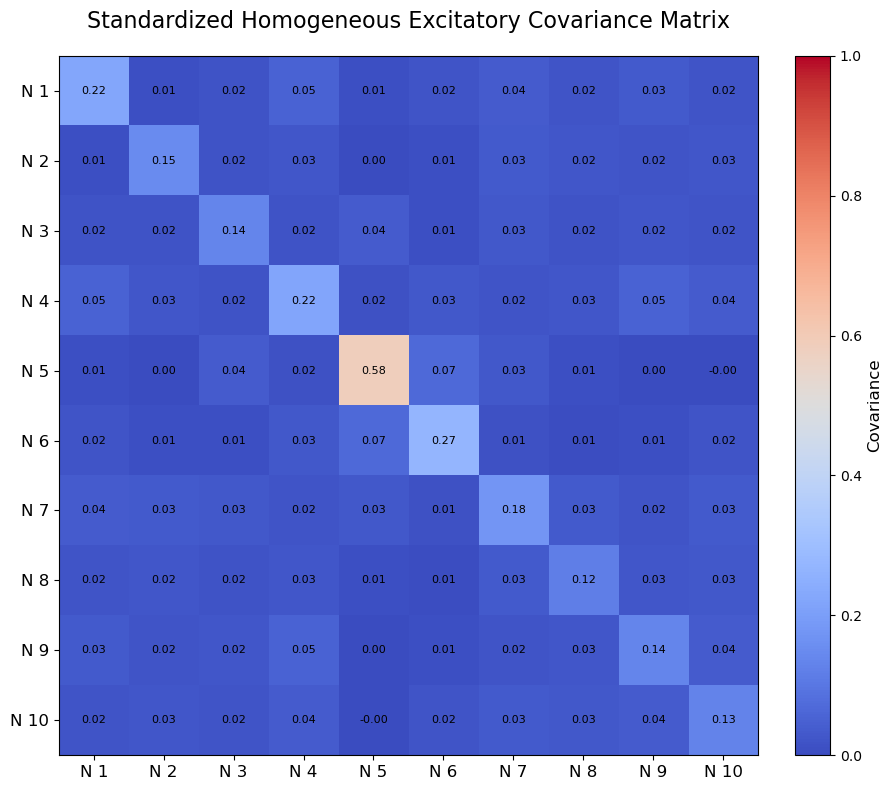

In [128]:
plot_covariance_matrix(cov_matrix_ex, normalize=False, title="Standardized Homogeneous Excitatory Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 0.21993807,  0.01065937,  0.01860661,  0.05233   ,  0.00864764,
         0.02182281,  0.03741074,  0.02026426,  0.03219488,  0.02240308],
       [ 0.01065937,  0.15004664,  0.01805829,  0.02542813,  0.00087459,
         0.00859308,  0.03323144,  0.02375733,  0.0212762 ,  0.02620743],
       [ 0.01860661,  0.01805829,  0.13925996,  0.01833109,  0.03585904,
         0.00989067,  0.02768574,  0.01873312,  0.0233617 ,  0.02239757],
       [ 0.05233   ,  0.02542813,  0.01833109,  0.21161319,  0.01386292,
         0.03051905,  0.02147315,  0.02421856,  0.05232158,  0.03573122],
       [ 0.00864764,  0.00087459,  0.03585904,  0.01386292,  0.54223696,
         0.06203458,  0.02951836,  0.00841607,  0.00110662, -0.00419109],
       [ 0.02182281,  0.00859308,  0.00989067,  0.03051905,  0.06203458,
         0.26226432,  0.01164949,  0.00622163,  0.01079876,  0.01973375],
       [ 0.03741074,  0.03323144,  0.02768574,  0.02147315,  0.02951836,
         0.01164949,  0.17447966,  0.03194784

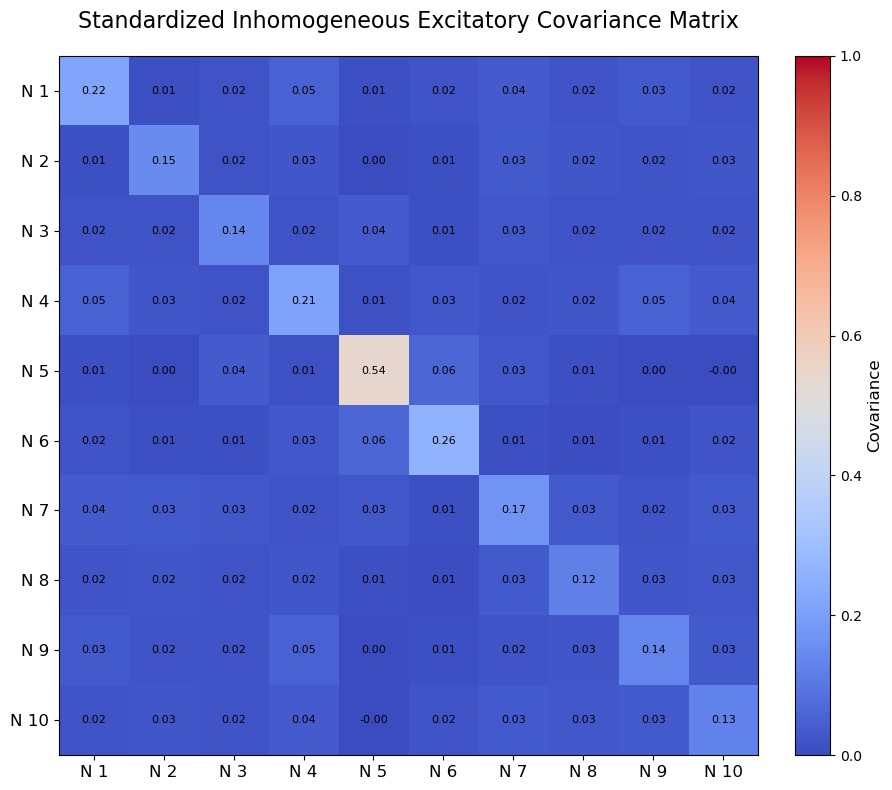

In [129]:
plot_covariance_matrix(cov_matrix_ex_emp, normalize=False, title="Standardized Inhomogeneous Excitatory Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

In [130]:
#hotelling_result_ex = hotelling_t2_test(reshaped_stands_ex, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_ex)
#hotelling_result_ex_emp = hotelling_t2_test(reshaped_stands_ex_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_ex_emp)

In [131]:
#cov_matrix_ex, diagonal_ones_ex = covariance_diagonal(reshaped_stands_ex, tol=1e-8)
#print(cov_matrix_ex)
#print(diagonal_ones_ex)
#cov_matrix_ex_emp, diagonal_ones_ex_emp = covariance_diagonal(reshaped_stands_ex_emp, tol=1e-8)
#print(cov_matrix_ex_emp)
#print(diagonal_ones_ex_emp)

In [132]:
#### TESTING #####
#plot_covariance_matrix(reshaped_data, normalize=False, title="Excitatory Theoretical Covariance Matrix", cmap='coolwarm', annot=True)

In [133]:
#### TESTING ####
#plot_covariance_matrix(reshaped_data_emp, normalize=False, title="Excitatory Empirical Covariance Matrix", cmap='coolwarm', annot=True)

In [134]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)

# rv_ex = multivariate_normal(mean = theoretical_means_sim_ex, cov = cov_matrix_ex, allow_singular=allow_singular)
# rv_ex_emp = multivariate_normal(mean = empirical_mean_ex, cov = cov_matrix_ex_emp, allow_singular=allow_singular)

# this is creating its own model, from this we can test if the data has goodness of fit

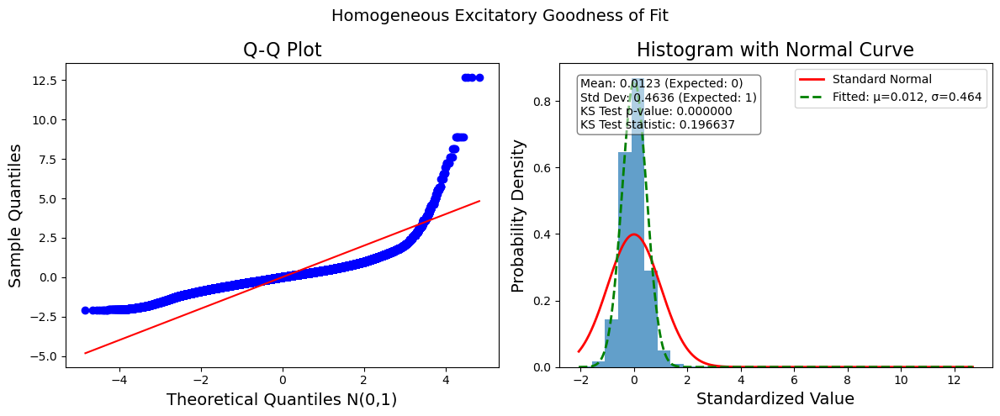

In [135]:
goodness_ex, fig_ex = analyze_poisson_goodness_of_fit(serialized_count_ex, plot_title="Homogeneous Excitatory Goodness of Fit", sample_limit=5000)

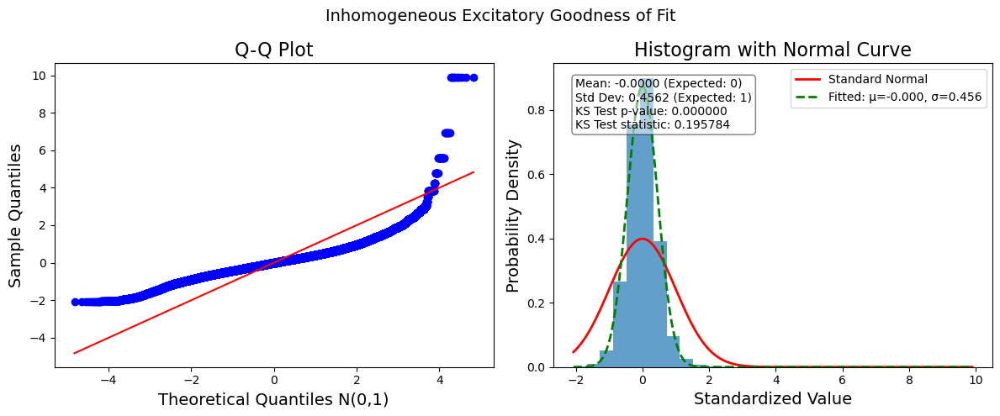

In [136]:
goodness_ex_emp, fig_ex_emp = analyze_poisson_goodness_of_fit(serialized_count_ex_emp, plot_title="Inhomogeneous Excitatory Goodness of Fit", sample_limit=5000)

Theoretical and Empirical stats of inhibitory counts.

In [138]:
# empirical_mean_in = empirical_means(count_in)
empirical_mean_in = count_in.mean(axis=0)
#print(empirical_mean_in)
#print(empirical_mean_in.shape)
count_rate_in = empirical_mean_in[:, -1]

#empirical_std_dev_in = std_dev_empirical_mean(empirical_mean_in, num_samples, count_in)
#empirical_std_dev_in = count_in.std(axis=0, ddof=1)
empirical_std_dev_in = np.sqrt(empirical_mean_in)
#print(empirical_std_dev_in)
#print(empirical_std_dev_in.shape)

empirical_lower_bound_in, empirical_upper_bound_in = confidence_intervals(empirical_mean_in, empirical_std_dev_in, num_samples, confidence_level=0.95)
# print(empirical_lower_bound_sim_in)
# print(empirical_upper_bound_sim_in)

In [139]:
exclude_times_in, global_exclude_in = last_zero_std_time(empirical_std_dev_in, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=0, recommended exclude=1
Neuron 2: last zero std at t=1, recommended exclude=2
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=0, recommended exclude=1
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=0, recommended exclude=1
Neuron 9: last zero std at t=0, recommended exclude=1

Global exclude (safest): t=2


In [140]:
theoretical_means_sim_in = calculate_theoretical_mean(count_rate_in, time)
#print(theoretical_means_sim_in)
#print(theoretical_means_sim_in.shape)

theoretical_std_dev_sim_in = calculate_theoretical_std_dev(theoretical_means_sim_in)
#print(theoretical_std_dev_sim_in)
#print(theoretical_std_dev_sim_in.shape)

theoretical_lower_bound_sim_in, theoretical_upper_bound_sim_in = confidence_intervals(theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound_sim_in)
# print(theoretical_upper_bound_sim_in)

In [141]:
res_var_in = variance_of_residuals(empirical_mean_in, theoretical_means_sim_in)
#print(res_var_in)

In [142]:
stands_in = standardize_counts_loop(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, num_neurons, exclude = 1)
#print(stands_in)
#print(stands_in.shape)

stands_in_emp = standardize_counts_loop(count_in, empirical_mean_in, empirical_std_dev_in, num_samples, num_neurons, global_exclude_in)
#print(stands_in_emp)
#print(stands_in_emp.shape)

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global_in = np.mean(stands_in)
standardized_std_global_in = np.std(stands_in)

standardized_mean_emp_global_in = np.mean(stands_in_emp)
standardized_std_emp_global_in = np.std(stands_in_emp)

standardized_mean_in = np.mean(stands_in, axis=0)
standardized_std_in = np.std(stands_in, axis=0, ddof = 1)

standardized_mean_in_emp = np.mean(stands_in_emp, axis = 0)
standardized_std_in_emp = np.std(stands_in_emp, axis = 0, ddof = 1)

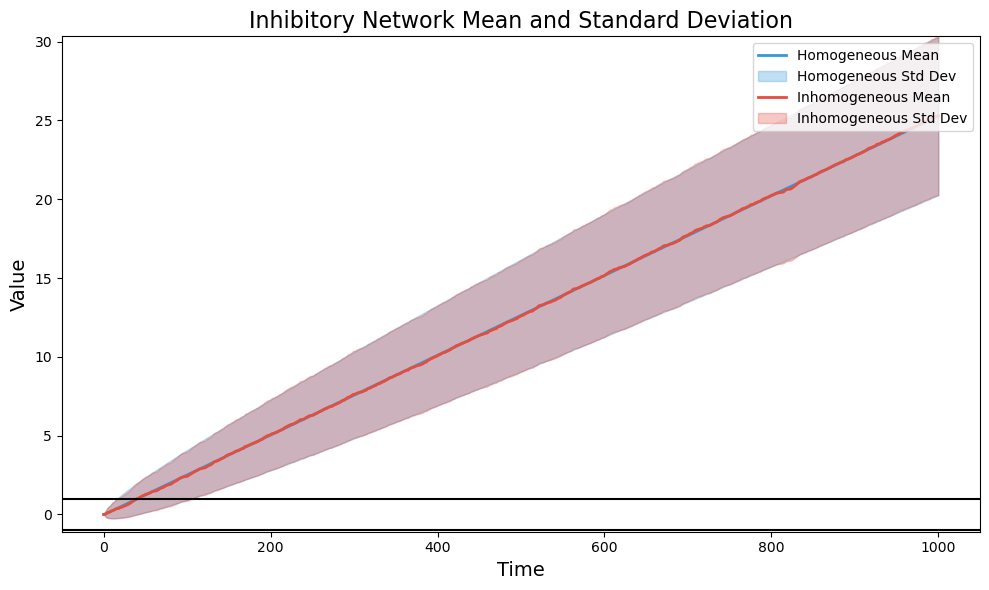

In [143]:
plot_stats(theoretical_means_sim_in , empirical_mean_in, theoretical_std_dev_sim_in, empirical_std_dev_in, title = 'Inhibitory Network Mean and Standard Deviation')

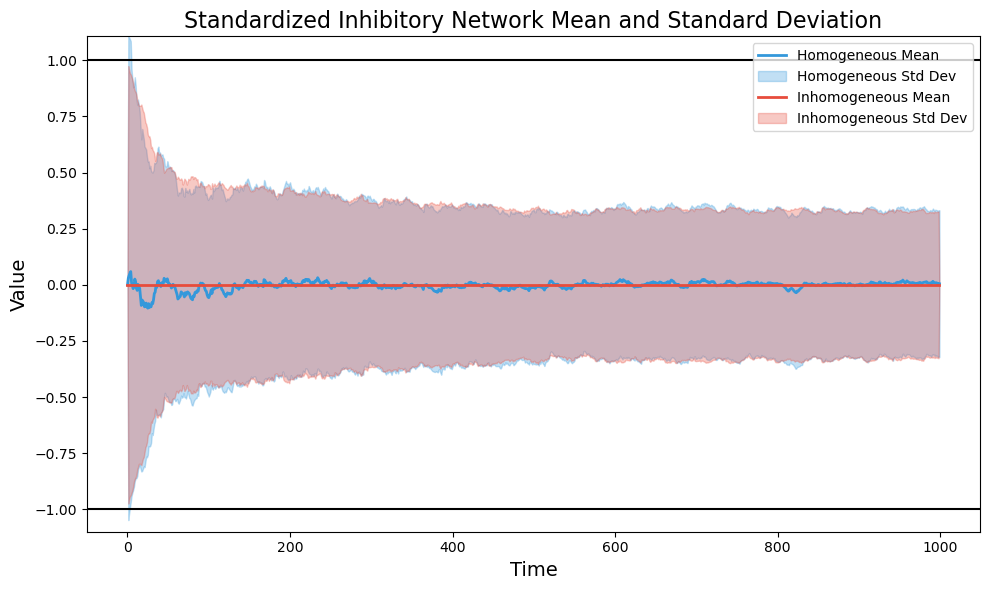

In [144]:
plot_stats(standardized_mean_in, standardized_mean_in_emp, standardized_std_in, standardized_std_in_emp, title = 'Standardized Inhibitory Network Mean and Standard Deviation')

In [145]:
mean_check_in = check_mean_with_se(stands_in, expected_mean=0, confidence=0.95)
#print(mean_check_in)

mean_check_in_emp = check_mean_with_se(stands_in_emp, expected_mean=0, confidence=0.95)
#print(mean_check_in_emp)

In [146]:
serialized_count_in = serialize_counts(stands_in) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_in.shape)
#print(np.mean(serialized_count_in))
t_stat_in, p_val_mean_in = stats.ttest_1samp(serialized_count_in, np.mean(serialized_count_in))
#print(t_stat_in)
#print(p_val_mean_in)
    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables


serialized_count_in_emp = serialize_counts(stands_in_emp) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_in_emp.shape)
#print(np.mean(serialized_count_in_emp))
t_stat_in_emp, p_val_mean_in_emp = stats.ttest_1samp(serialized_count_in_emp, np.mean(serialized_count_in_emp))
#print(t_stat_in_emp)
#print(p_val_mean_in_emp)

In [147]:
#reshaped_stands_in = np.reshape(stands_in, (-1, stands_in.shape[1]), order='F')
reshaped_stands_in = np.transpose(stands_in, (1, 0, 2)).reshape(stands_in.shape[1], -1)
#print(stands_in.shape)
#print(reshaped_stands_in.shape)

#reshaped_stands_in_emp = np.reshape(stands_in_emp, (-1, stands_in_emp.shape[1]), order='F')
reshaped_stands_in_emp = np.transpose(stands_in_emp, (1, 0, 2)).reshape(stands_in_emp.shape[1], -1)
#print(stands_in_emp.shape)
#print(reshaped_stands_in_emp.shape)

In [148]:
cov_matrix_in = cov_standardized_data(reshaped_stands_in)
cov_matrix_in_emp = cov_standardized_data(reshaped_stands_in_emp)

array([[ 1.50579913e-01,  1.45429159e-02,  2.63736571e-02,
         4.06681250e-02,  2.24033678e-02,  1.08328996e-02,
         2.08415126e-02,  3.15463263e-02,  2.80498579e-02,
         2.74774302e-02],
       [ 1.45429159e-02,  1.54970033e-01,  2.72971953e-02,
         3.92686570e-03,  1.90873547e-02, -4.08495226e-06,
         1.81199901e-02,  6.88114580e-03,  3.32830190e-03,
         2.56874484e-02],
       [ 2.63736571e-02,  2.72971953e-02,  1.42502345e-01,
         1.19897212e-02,  1.80398232e-02,  7.85857061e-03,
         2.29912643e-02,  2.38547590e-02,  1.23378942e-02,
         2.84176358e-02],
       [ 4.06681250e-02,  3.92686570e-03,  1.19897212e-02,
         2.85708646e-01,  2.80065510e-02,  2.17403448e-02,
         2.31700793e-02, -8.74849153e-03,  1.47075469e-03,
         3.14783177e-02],
       [ 2.24033678e-02,  1.90873547e-02,  1.80398232e-02,
         2.80065510e-02,  1.97899508e-01,  1.37731881e-02,
         1.86236116e-02,  1.22122474e-02, -2.28389393e-03,
         4.

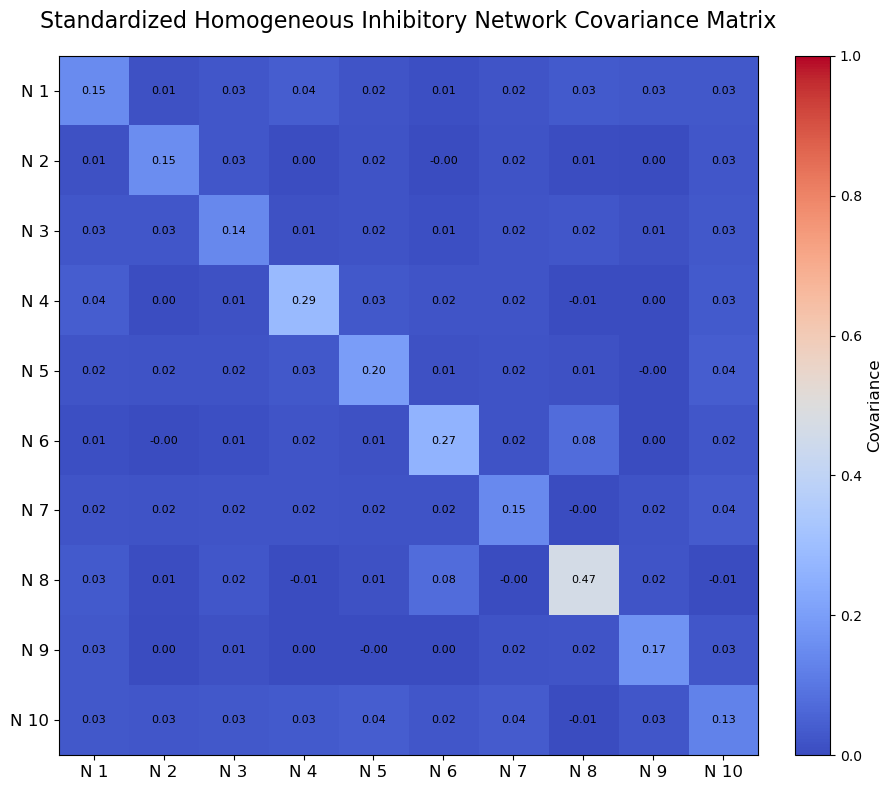

In [149]:
plot_covariance_matrix(cov_matrix_in, normalize=False, title="Standardized Homogeneous Inhibitory Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.50008535e-01,  1.44772023e-02,  2.63242401e-02,
         4.03960852e-02,  2.24852965e-02,  1.08236288e-02,
         2.04141407e-02,  3.14164789e-02,  2.82826481e-02,
         2.76051287e-02],
       [ 1.44772023e-02,  1.53254499e-01,  2.72653003e-02,
         4.29771681e-03,  1.89358397e-02, -7.23729393e-04,
         1.79536371e-02,  6.19616614e-03,  3.52032956e-03,
         2.56193246e-02],
       [ 2.63242401e-02,  2.72653003e-02,  1.45619932e-01,
         1.31624572e-02,  1.78865232e-02,  7.98492222e-03,
         2.26872417e-02,  2.40121307e-02,  1.26918243e-02,
         2.87114242e-02],
       [ 4.03960852e-02,  4.29771681e-03,  1.31624572e-02,
         2.62754437e-01,  2.70211484e-02,  2.04440423e-02,
         2.33918345e-02, -8.86906849e-03, -1.77133748e-05,
         3.14344750e-02],
       [ 2.24852965e-02,  1.89358397e-02,  1.78865232e-02,
         2.70211484e-02,  1.92614301e-01,  1.30452593e-02,
         1.80396407e-02,  1.06150693e-02, -2.52671922e-03,
         4.

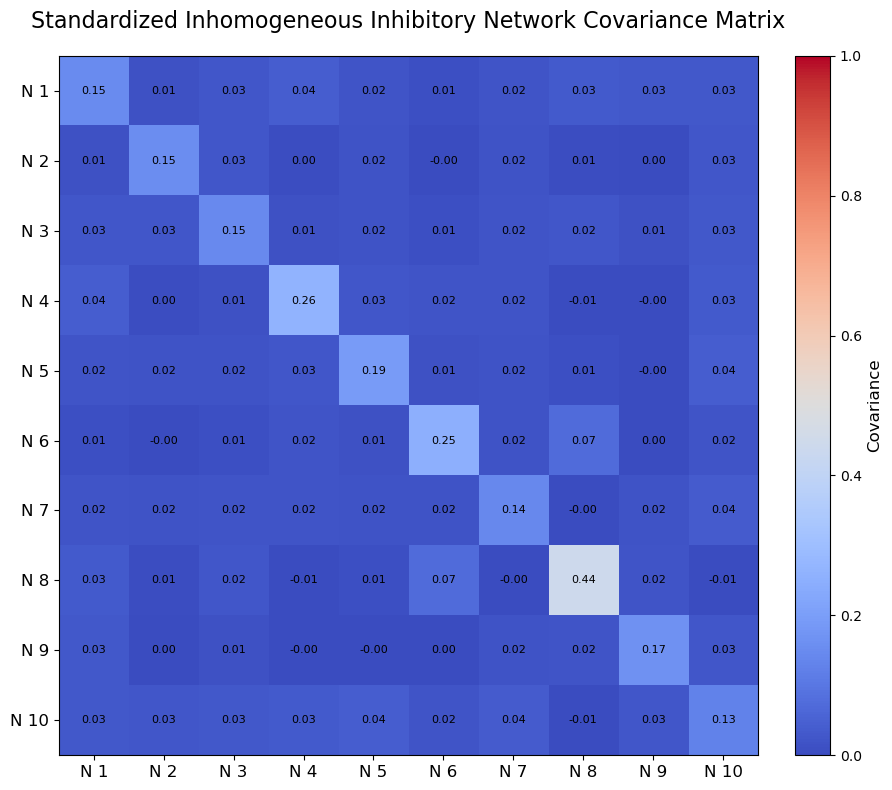

In [150]:
plot_covariance_matrix(cov_matrix_in_emp, normalize=False, title="Standardized Inhomogeneous Inhibitory Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

In [151]:
#hotelling_result_in = hotelling_t2_test(reshaped_stands_in, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_in)
#hotelling_result_in_emp = hotelling_t2_test(reshaped_stands_in_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_in_emp)

In [152]:
#cov_matrix_in, diagonal_ones_in = covariance_diagonal(reshaped_stands_in, tol=1e-8)
#print(cov_matrix_in)
#print(diagonal_ones_in)
#cov_matrix_in_emp, diagonal_ones_in_emp = covariance_diagonal(reshaped_stands_in_emp, tol=1e-8)
#print(cov_matrix_in_emp)
#print(diagonal_ones_in_emp)

In [153]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)

# rv_in = multivariate_normal(mean = theoretical_means_sim_in, cov = cov_matrix_in, allow_singular=allow_singular)
# rv_in_emp = multivariate_normal(mean = empirical_mean_in, cov = cov_matrix_in_emp, allow_singular=allow_singular)

# this is creating its own model, from this we can test if the data has goodness of fit

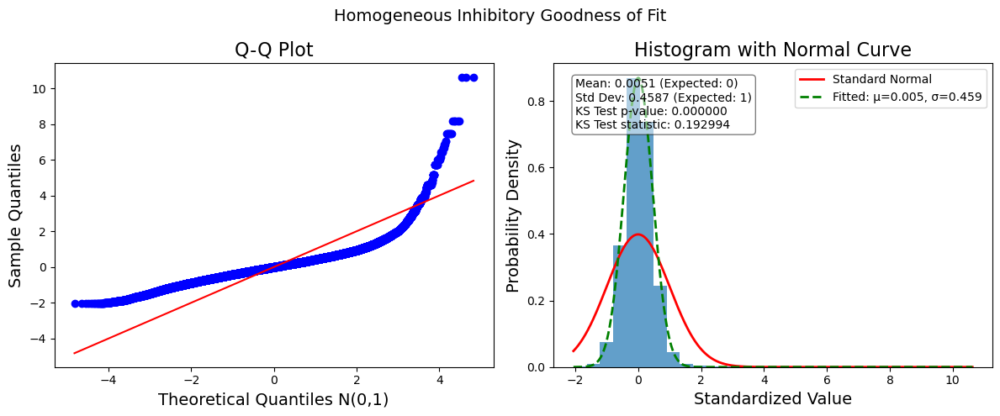

In [154]:
goodness_in, fig_in = analyze_poisson_goodness_of_fit(serialized_count_in, plot_title="Homogeneous Inhibitory Goodness of Fit", sample_limit=5000)

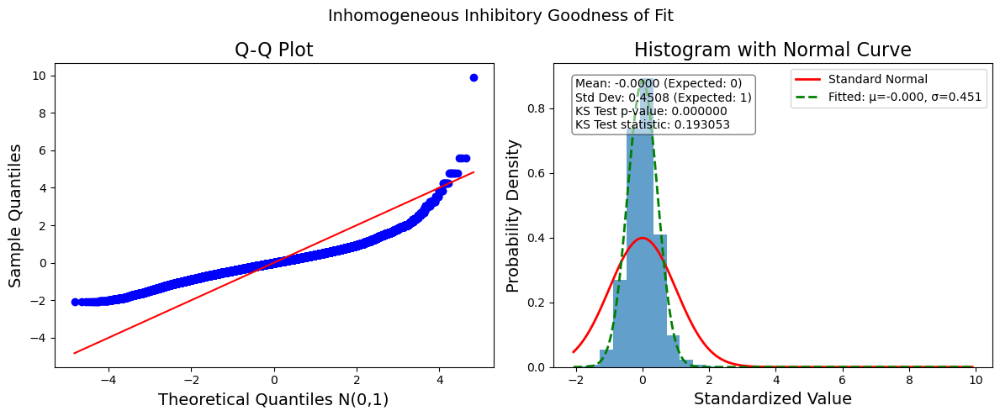

In [155]:
goodness_in_emp, fig_in_emp = analyze_poisson_goodness_of_fit(serialized_count_in_emp, plot_title="Inhomogeneous Inhibitory Goodness of Fit", sample_limit=5000)

Balanced Excitatory and Inhibitory Experiments

In [157]:
# Original excitatory and inhibitory data shapes
print(reshaped_stands_ex.shape)
print(reshaped_stands_in.shape)

print(reshaped_stands_ex_emp.shape)
print(reshaped_stands_in_emp.shape)

(10, 99900)
(10, 99900)
(10, 100000)
(10, 99800)


In [158]:
balanced_data, labels, types = create_balanced_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
print(f"\nBalanced dataset shape: {balanced_data.shape}")
print(f"Neuron labels: {labels}")
print(f"Neuron types: {types}")

balanced_data_emp, labels_emp, types_emp = create_balanced_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
print(f"\nBalanced Empirical dataset shape: {balanced_data_emp.shape}")
print(f"Neuron Empirical labels: {labels_emp}")
print(f"Neuron Empirical types: {types_emp}")
# Balanced = Joint, don't use balance because it could be interpreted as something it isn't
# add option to randomize joint excitatory and inhibitory neurons
# Get neuron id from spike train instead of label


Balanced dataset shape: (10, 99900)
Neuron labels: ['E0', 'E1', 'E2', 'E3', 'E4', 'I0', 'I1', 'I2', 'I3', 'I4']
Neuron types: ['E', 'E', 'E', 'E', 'E', 'I', 'I', 'I', 'I', 'I']

Balanced Empirical dataset shape: (10, 99800)
Neuron Empirical labels: ['E0', 'E1', 'E2', 'E3', 'E4', 'I0', 'I1', 'I2', 'I3', 'I4']
Neuron Empirical types: ['E', 'E', 'E', 'E', 'E', 'I', 'I', 'I', 'I', 'I']


In [159]:
cov_matrix_balance = cov_standardized_data(balanced_data)
cov_matrix_balance_emp = cov_standardized_data(balanced_data_emp)

array([[ 0.22284299,  0.01102331,  0.01831367,  0.05357434,  0.01105586,
         0.0308124 ,  0.00919282, -0.00548469,  0.01189199,  0.04942525],
       [ 0.01102331,  0.15089915,  0.01804073,  0.02579351,  0.00223225,
         0.01188977,  0.01705246,  0.01266299,  0.01725604,  0.00694861],
       [ 0.01831367,  0.01804073,  0.13560127,  0.0181642 ,  0.03605204,
         0.0157318 ,  0.02332605,  0.01516044,  0.03140687,  0.01384475],
       [ 0.05357434,  0.02579351,  0.0181642 ,  0.2221515 ,  0.01543729,
         0.03582443,  0.01806739,  0.0264102 ,  0.02827828,  0.04125565],
       [ 0.01105586,  0.00223225,  0.03605204,  0.01543729,  0.58386479,
         0.02804222,  0.01668016,  0.00714437,  0.04530259, -0.01116869],
       [ 0.0308124 ,  0.01188977,  0.0157318 ,  0.03582443,  0.02804222,
         0.15057991,  0.01454292,  0.02637366,  0.04066813,  0.02240337],
       [ 0.00919282,  0.01705246,  0.02332605,  0.01806739,  0.01668016,
         0.01454292,  0.15497003,  0.0272972 

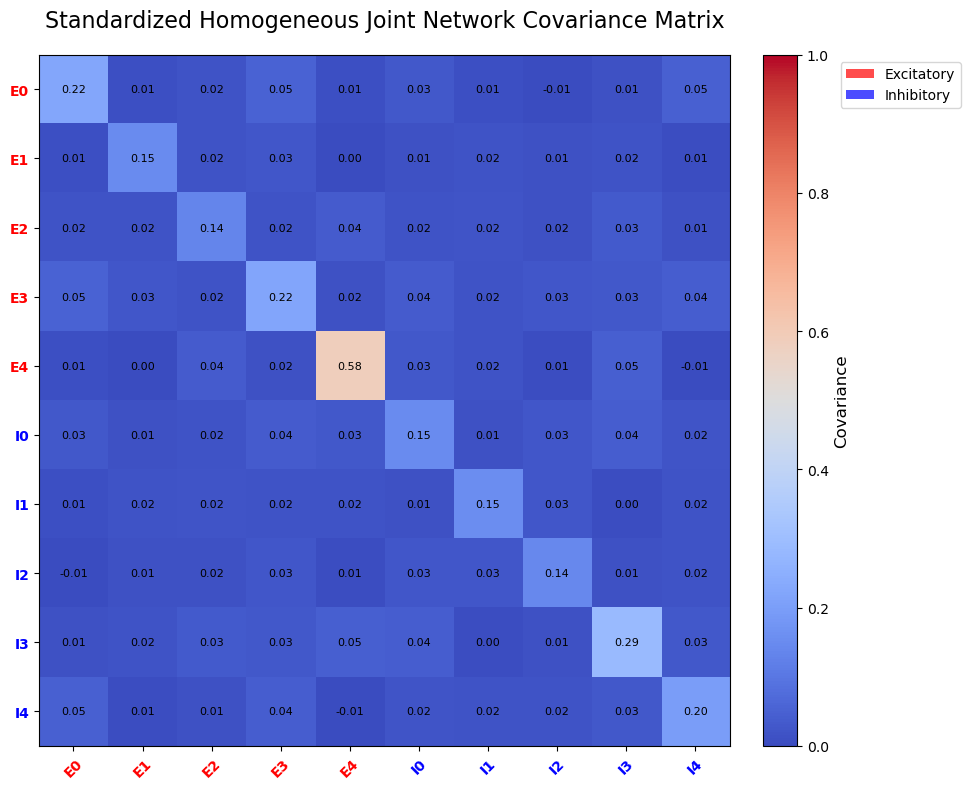

In [160]:
plot_covariance_matrix(cov_matrix_balance, normalize=False, title="Standardized Homogeneous Joint Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=labels)

array([[ 0.21971441,  0.01079637,  0.01861505,  0.05301453,  0.00857424,
         0.01695585,  0.00242422, -0.01046466,  0.00636537,  0.03527142],
       [ 0.01079637,  0.1503147 ,  0.01809403,  0.02536746,  0.00089004,
         0.00631232,  0.0120017 ,  0.00604654,  0.01259494,  0.00069577],
       [ 0.01861505,  0.01809403,  0.13952789,  0.01838252,  0.03592144,
         0.00406262,  0.01642845,  0.00427963,  0.01998809,  0.00583468],
       [ 0.05301453,  0.02536746,  0.01838252,  0.2115079 ,  0.01395797,
         0.02186577,  0.01227117,  0.01232432,  0.01550565,  0.02864936],
       [ 0.00857424,  0.00089004,  0.03592144,  0.01395797,  0.54328204,
         0.02133307,  0.00637047, -0.00132665,  0.01758748, -0.01577392],
       [ 0.01695585,  0.00631232,  0.00406262,  0.02186577,  0.02133307,
         0.15000853,  0.0144772 ,  0.02632424,  0.04039609,  0.0224853 ],
       [ 0.00242422,  0.0120017 ,  0.01642845,  0.01227117,  0.00637047,
         0.0144772 ,  0.1532545 ,  0.0272653 

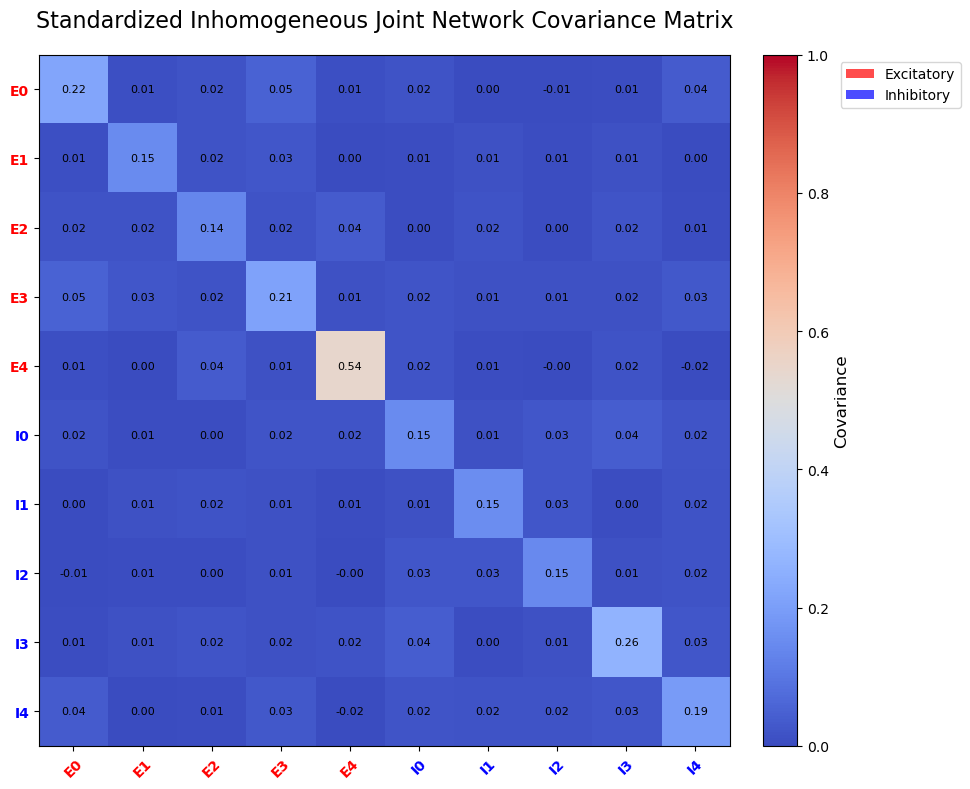

In [161]:
plot_covariance_matrix(cov_matrix_balance_emp, normalize=False, title="Standardized Inhomogeneous Joint Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=labels_emp)

In [162]:
#interleaved_data, int_labels, int_types = create_interleaved_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
#print(f"\nInterleaved dataset shape: {interleaved_data.shape}")
#print(f"Neuron labels: {int_labels}")
#print(f"Neuron types: {int_types}")

#interleaved_data_emp, int_labels_emp, int_types_emp = create_interleaved_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
#print(f"\nInterleaved Empirical dataset shape: {interleaved_data_emp.shape}")
#print(f"Neuron Empirical labels: {int_labels_emp}")
#print(f"Neuron Empirical types: {int_types_emp}")

In [163]:
#cov_matrix_interleaved = cov_standardized_data(interleaved_data)
#cov_matrix_interleaved_emp = cov_standardized_data(interleaved_data_emp)

In [164]:
#plot_covariance_matrix(cov_matrix_interleaved, normalize=False, title="Standardized Homogeneous Interleaved Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=int_labels)

In [165]:
#plot_covariance_matrix(cov_matrix_interleaved_emp, normalize=False, title="Standardized Inhomogeneous Interleaved Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=int_labels_emp)

In [166]:
#random_data, rand_labels, rand_types = create_random_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
#print(f"\nRandom dataset shape: {random_data.shape}")
#print(f"Neuron labels: {rand_labels}")
#print(f"Neuron types: {rand_types}")

#random_data_emp, rand_labels_emp, rand_types_emp = create_random_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
#print(f"\nRandom Empirical dataset shape: {random_data_emp.shape}")
#print(f"Neuron Empirical labels: {rand_labels_emp}")
#print(f"Neuron Empirical types: {rand_types_emp}")

In [167]:
#cov_matrix_random = cov_standardized_data(random_data)
#cov_matrix_random_emp = cov_standardized_data(random_data_emp)

In [168]:
#plot_covariance_matrix(cov_matrix_random, normalize=False, title="Standardized Homogeneous Random Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=rand_labels)

In [169]:
#plot_covariance_matrix(cov_matrix_random_emp, normalize=False, title="Standardized Inhomogeneous Random Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=rand_labels_emp)

Plots of raw counts, excitatory counts, and inhibitory counts centered and standardized.

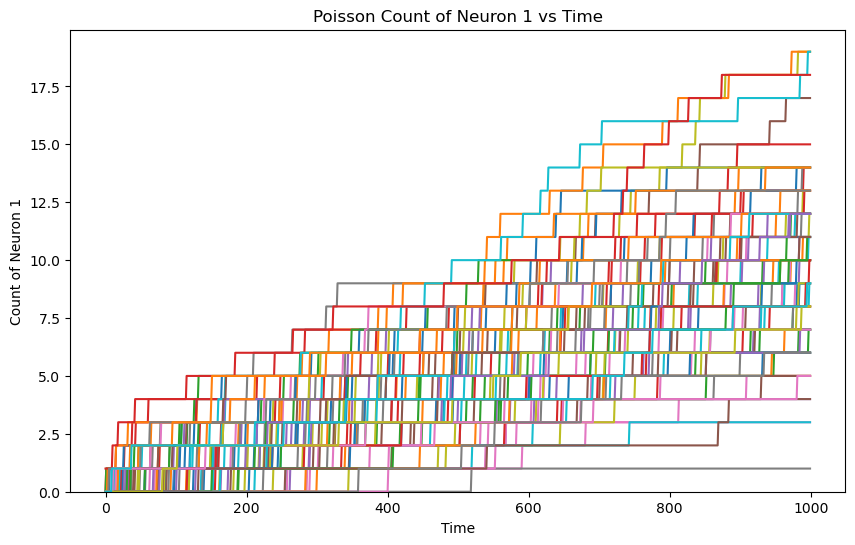

In [171]:
# plot_count_neuron1_vs_time(random_samples, num_samples = 5)
plot_count_neuron1_vs_time(count, num_samples, title = 'Poisson Count of Neuron 1 vs Time')

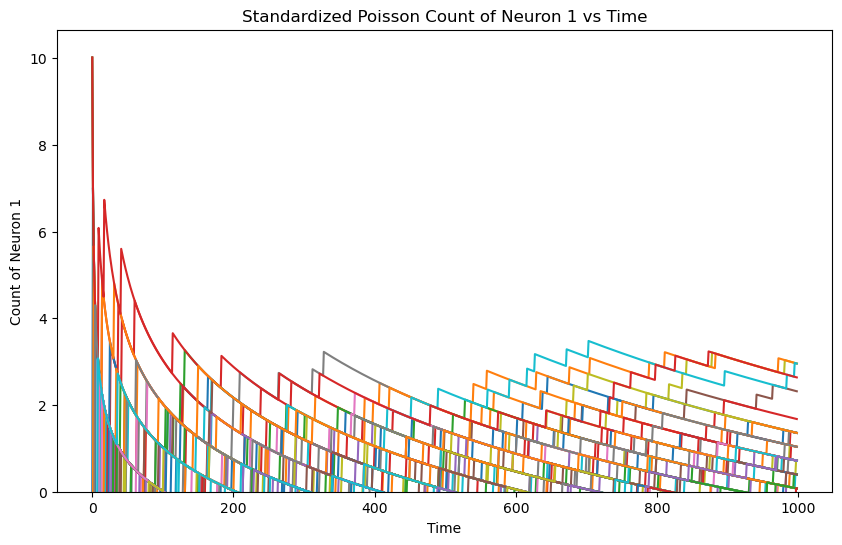

In [172]:
plot_count_neuron1_vs_time(stands, num_samples, title = 'Standardized Poisson Count of Neuron 1 vs Time')

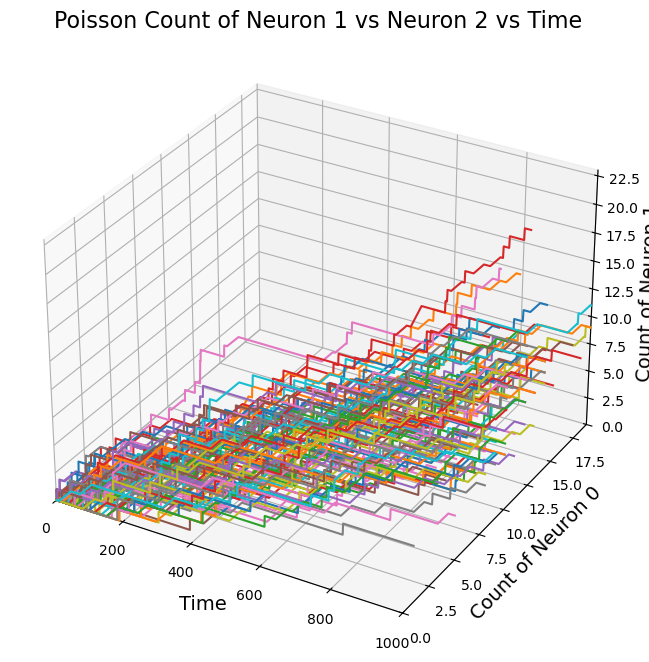

In [173]:
plot_count_neuron1_vs_neuron2_vs_time(count, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Poisson Count of Neuron 1 vs Neuron 2 vs Time' )

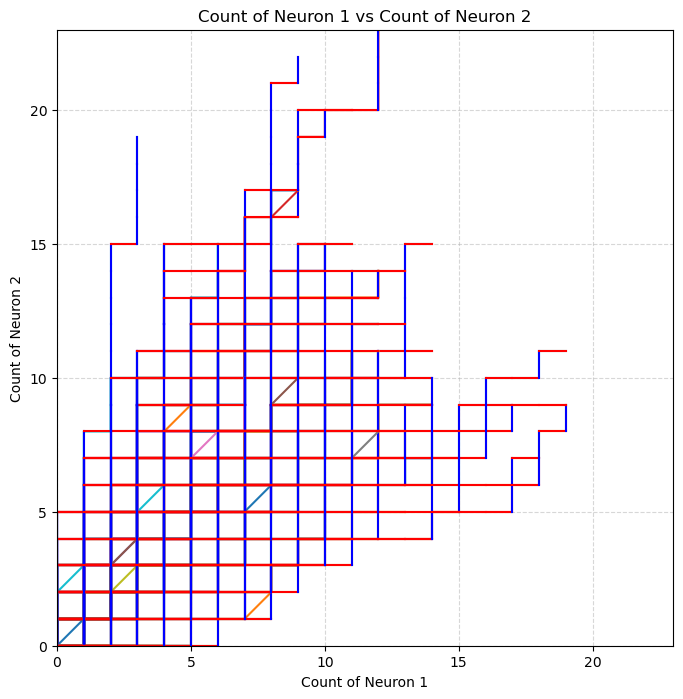

In [174]:
plot_count_neuron1_vs_count_neuron2(count, num_samples)

In [175]:
# plot_count_neuron1_vs_count_neuron2_vs_count_neuron3(count, num_samples)

In [176]:
# combined_poisson_plot(spike_train, count, theoretical_means, empirical_mean, colors=None, figsize=(12, 10))

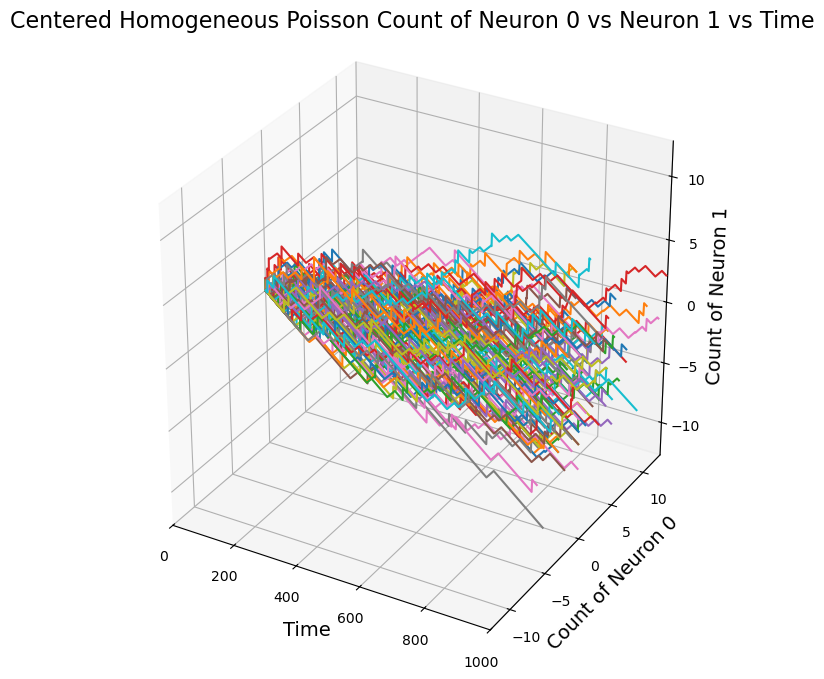

In [177]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
plot_centered_staircase_3d(count, theoretical_means, theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time' )

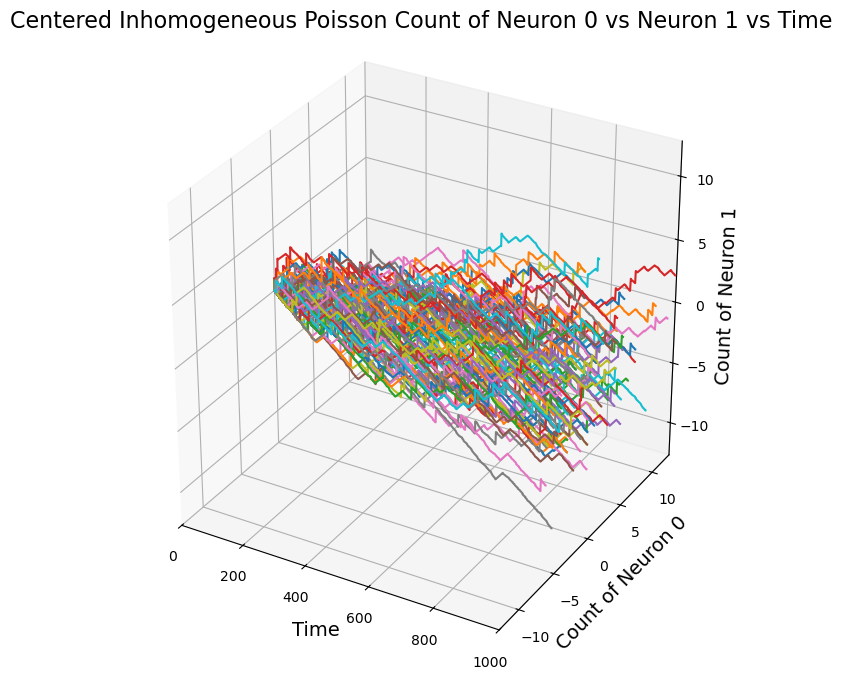

In [178]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
plot_centered_staircase_3d(count, empirical_mean, empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

WARNING    C:\Users\agreg\neural_simulation_functions.py:345: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]
WARNING    C:\Users\agreg\neural_simulation_functions.py:346: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]
WARNING    C:\Users\agreg\neural_simulation_functions.py:345: RuntimeWarning: divide by zero encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]


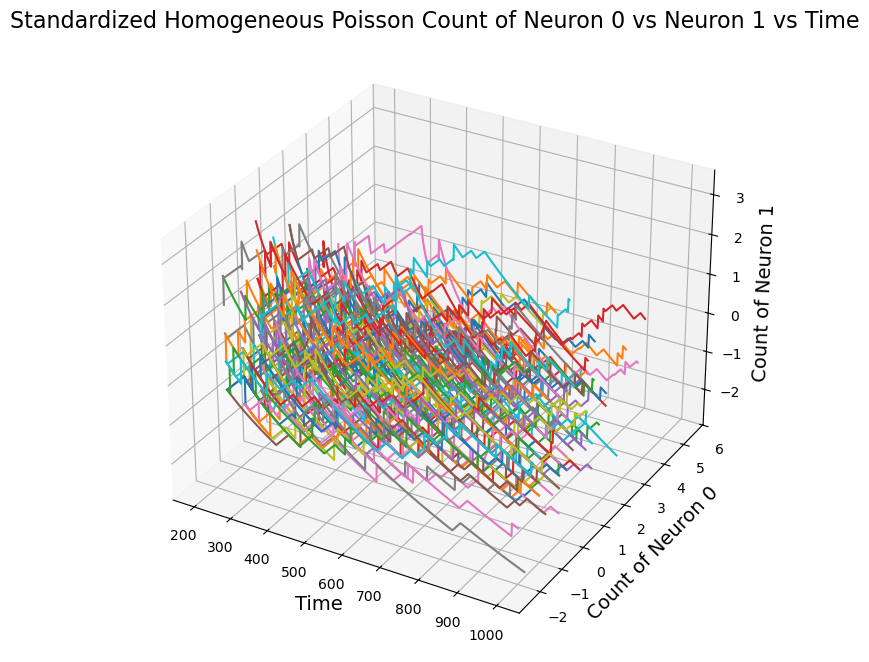

In [179]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(count, theoretical_means, theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

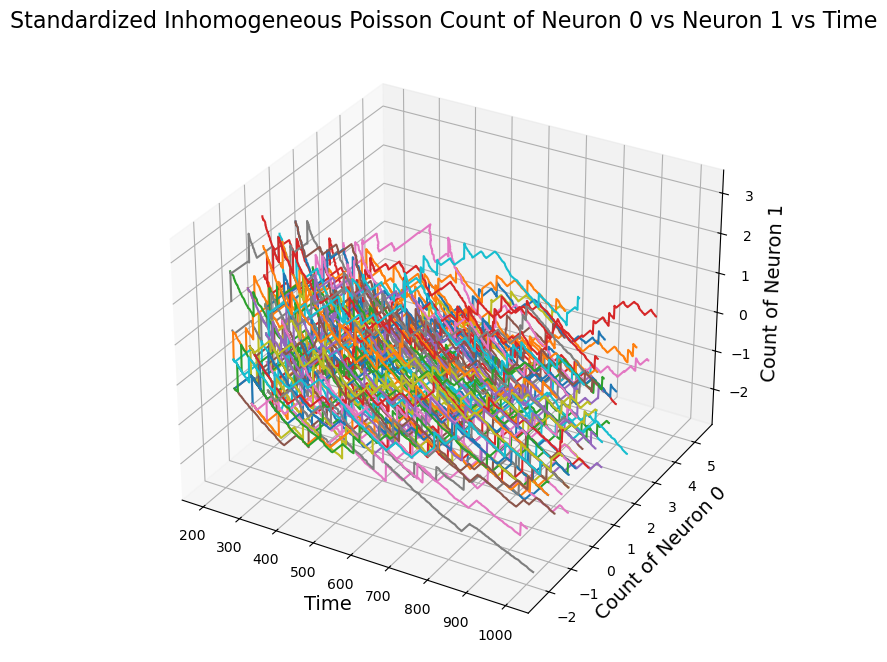

In [180]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(count, empirical_mean, empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

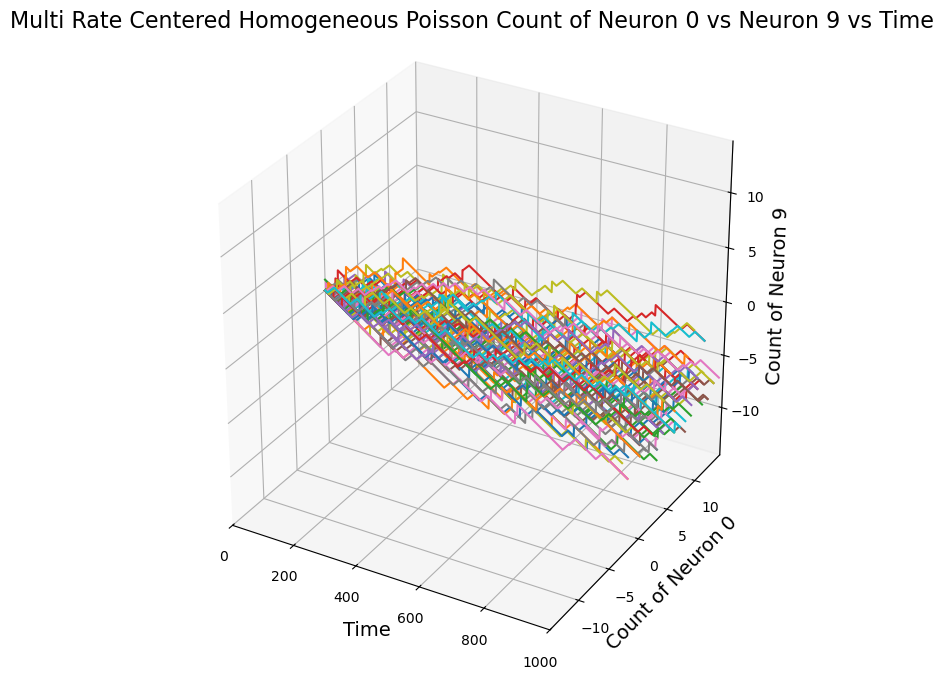

In [181]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
# plot_centered_staircase_3d(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time' )
plot_centered_staircase_3d(multi_rate_count, theoretical_means, theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time' )

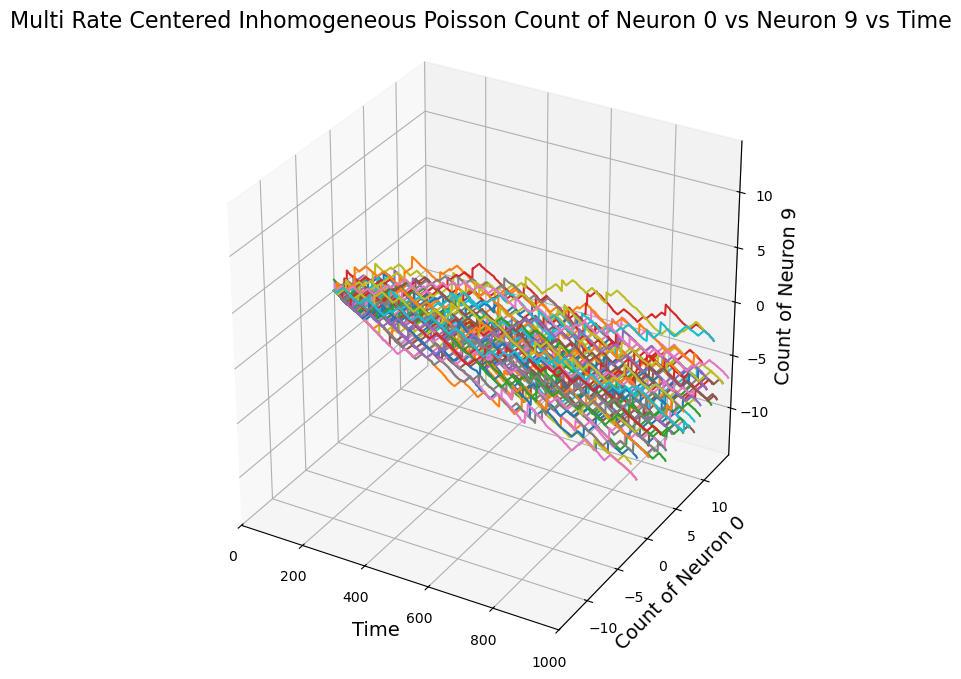

In [182]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
# plot_centered_staircase_3d(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')
plot_centered_staircase_3d(multi_rate_count, empirical_mean, empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

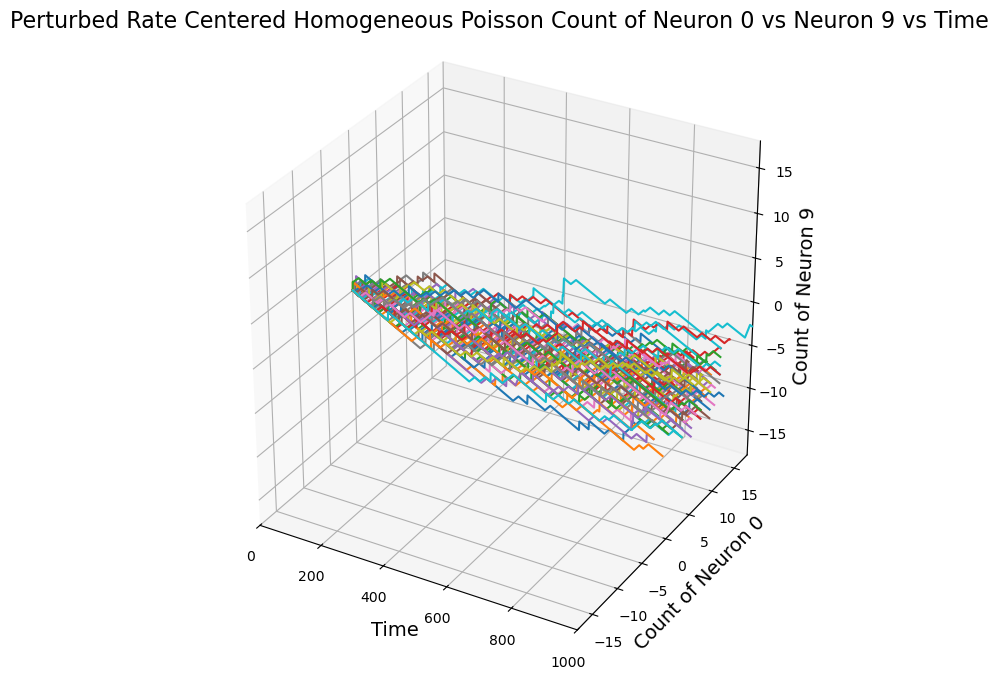

In [183]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
# plot_centered_staircase_3d(perturbed_rate_count, perturbed_rate_theoretical_means, perturbed_rate_theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time' )
plot_centered_staircase_3d(perturbed_rate_count, theoretical_means, theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time' )

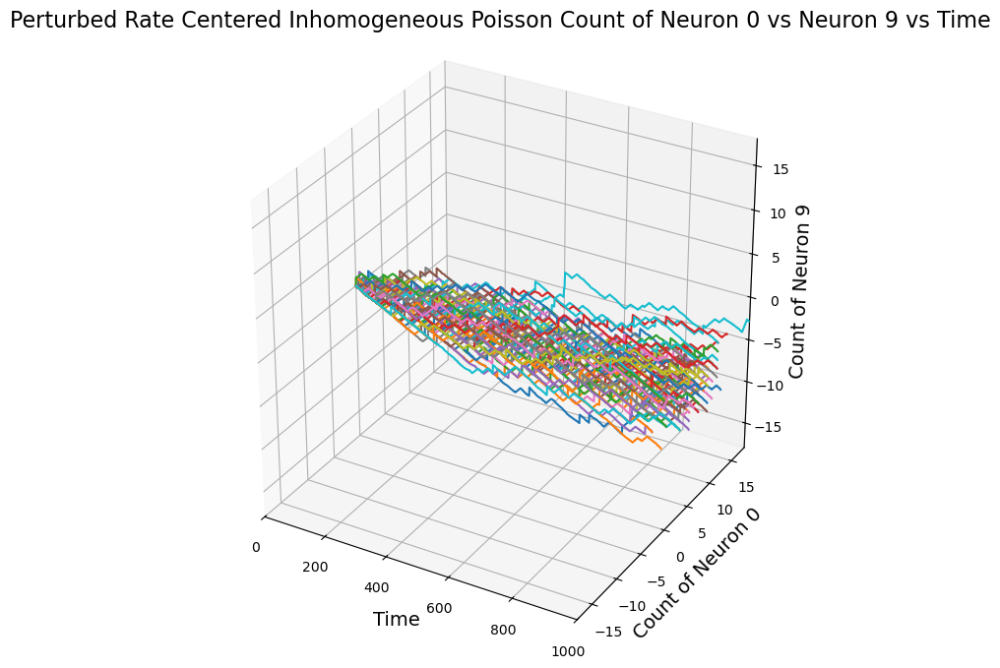

In [184]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
# plot_centered_staircase_3d(perturbed_rate_count, perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')
plot_centered_staircase_3d(perturbed_rate_count, empirical_mean, empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

WARNING    C:\Users\agreg\neural_simulation_functions.py:346: RuntimeWarning: divide by zero encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]


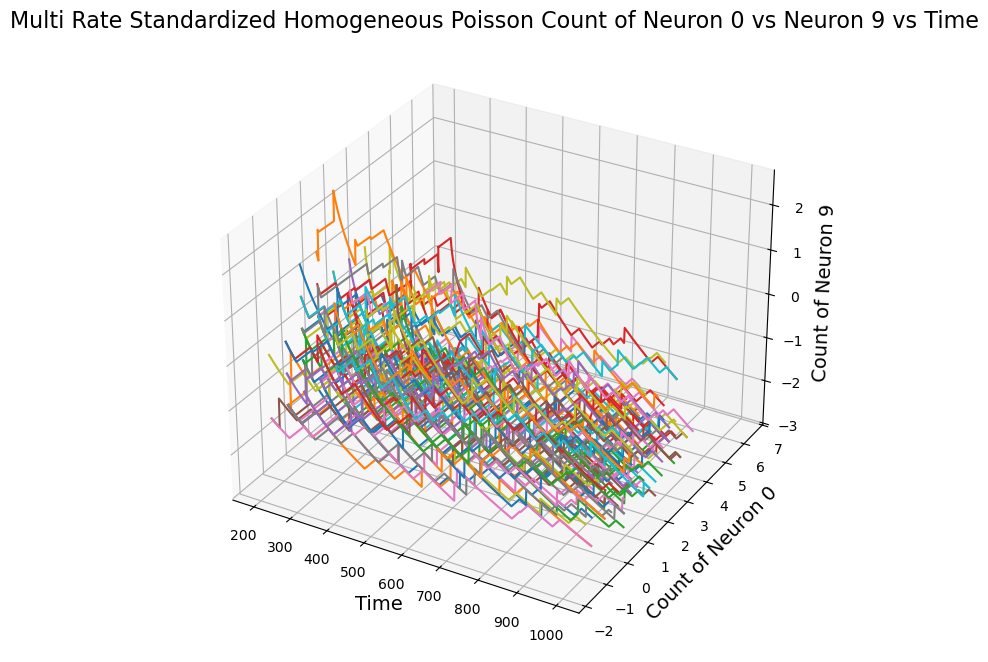

In [185]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
# plot_standardized_staircase_3d(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')
plot_standardized_staircase_3d(multi_rate_count, theoretical_means, theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

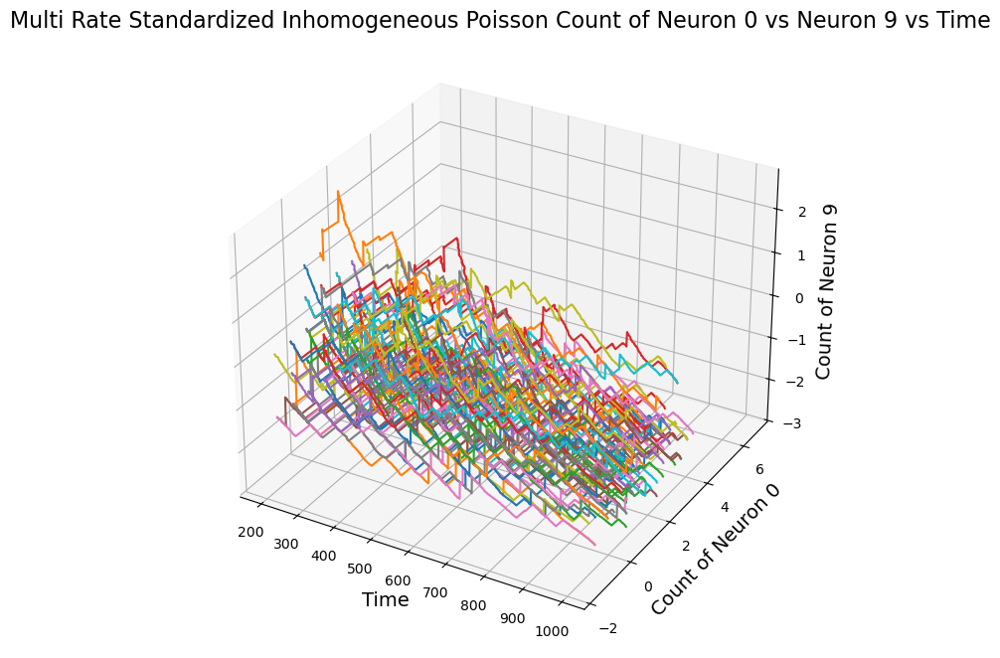

In [186]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
# plot_standardized_staircase_3d(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')
plot_standardized_staircase_3d(multi_rate_count, empirical_mean, empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

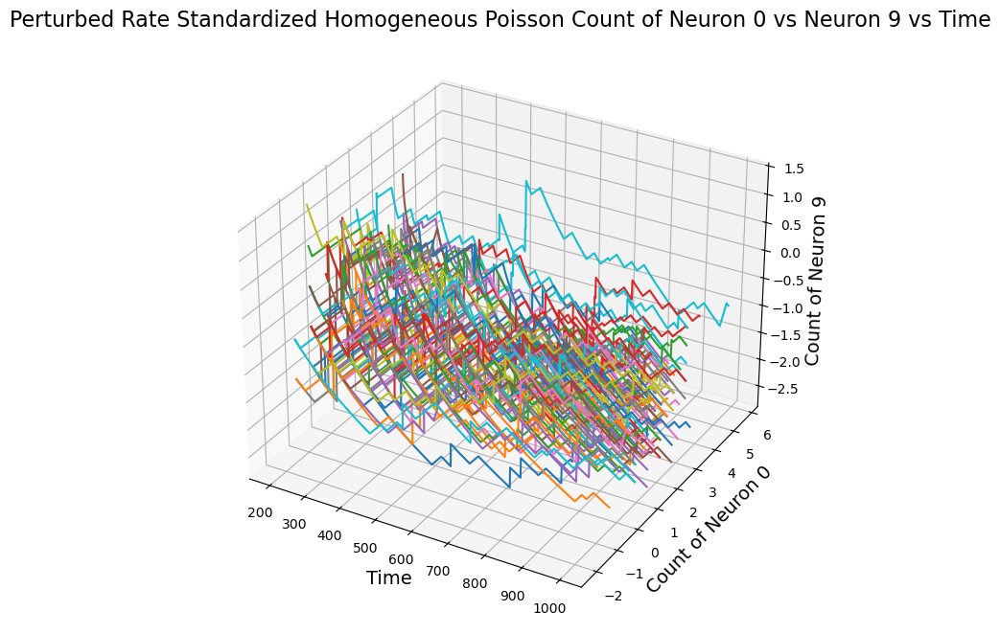

In [187]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
# plot_standardized_staircase_3d(perturbed_rate_count, perturbed_rate_theoretical_means, perturbed_rate_theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')
plot_standardized_staircase_3d(perturbed_rate_count, theoretical_means, theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

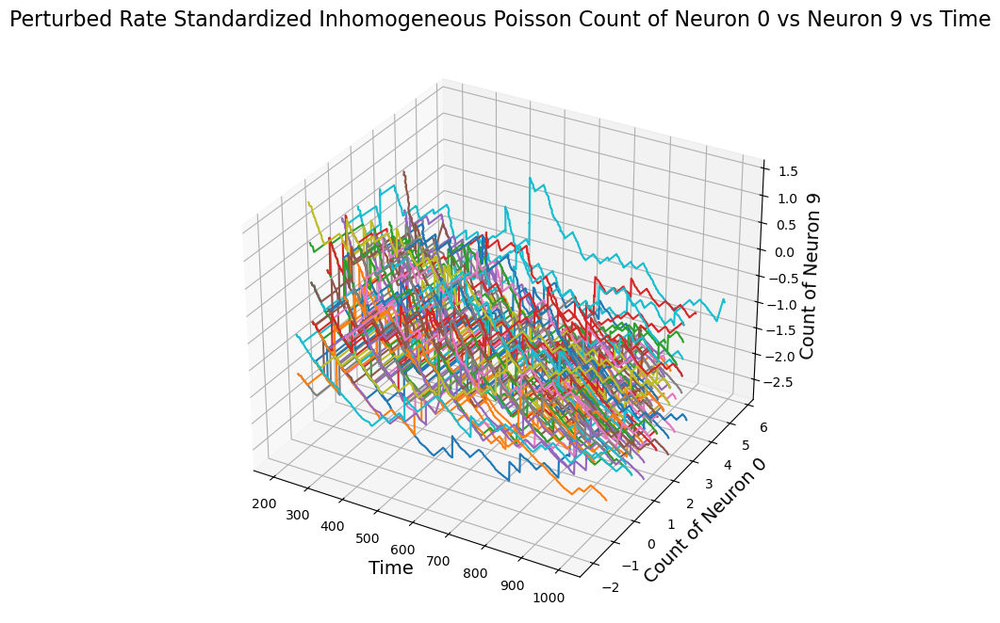

In [188]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
# plot_standardized_staircase_3d(perturbed_rate_count, perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')
plot_standardized_staircase_3d(perturbed_rate_count, empirical_mean, empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

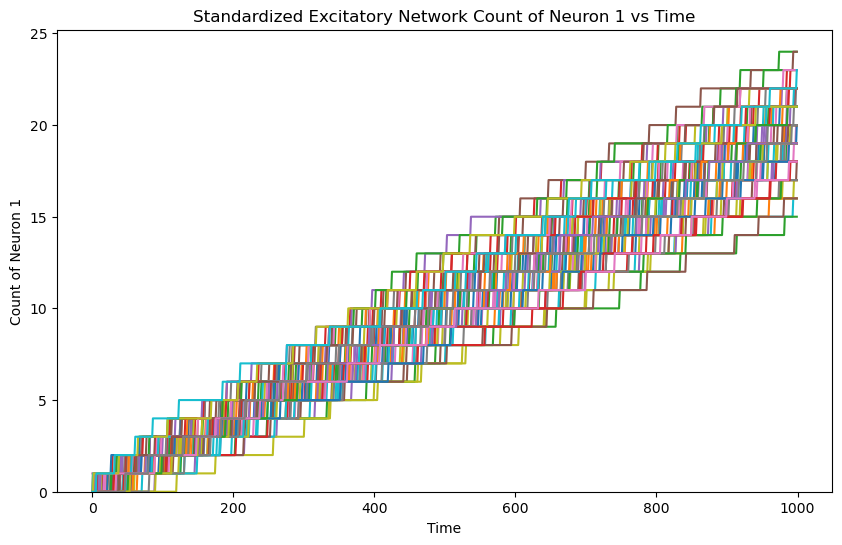

In [189]:
#plot_count_neuron1_vs_time(random_samples_ex, num_samples = 5)
plot_count_neuron1_vs_time(count_ex, num_samples, title = 'Standardized Excitatory Network Count of Neuron 1 vs Time')

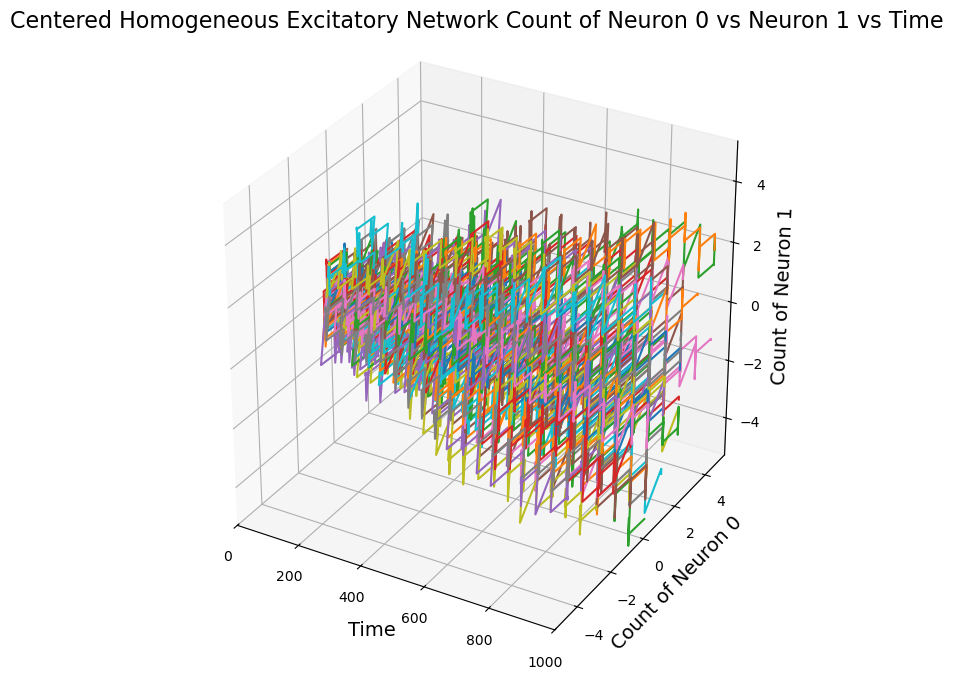

In [190]:
#plot_centered_staircase_3d(random_samples_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples= 5)
plot_centered_staircase_3d(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

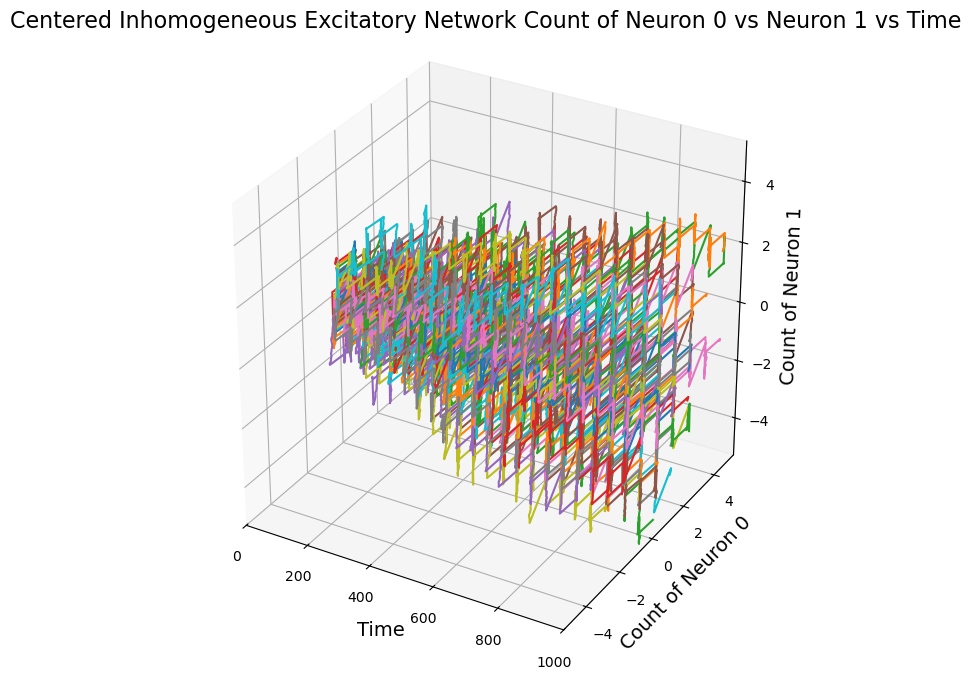

In [191]:
#plot_centered_staircase_3d(random_samples_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples= 5)
plot_centered_staircase_3d(count_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

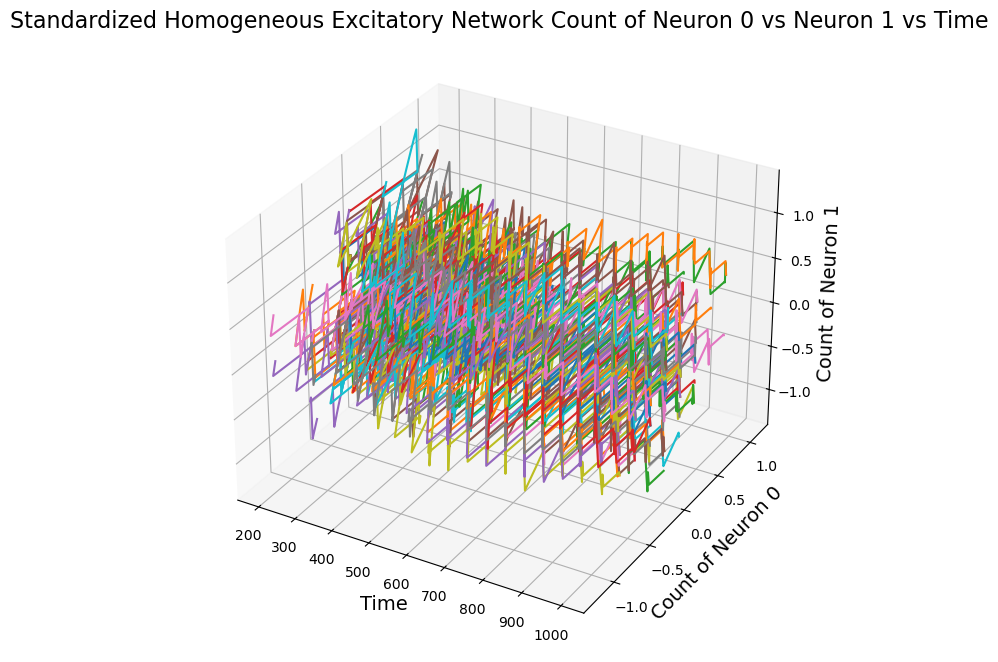

In [192]:
#plot_standardized_staircase_3d(random_samples_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, t0, num_samples=5)
plot_standardized_staircase_3d(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

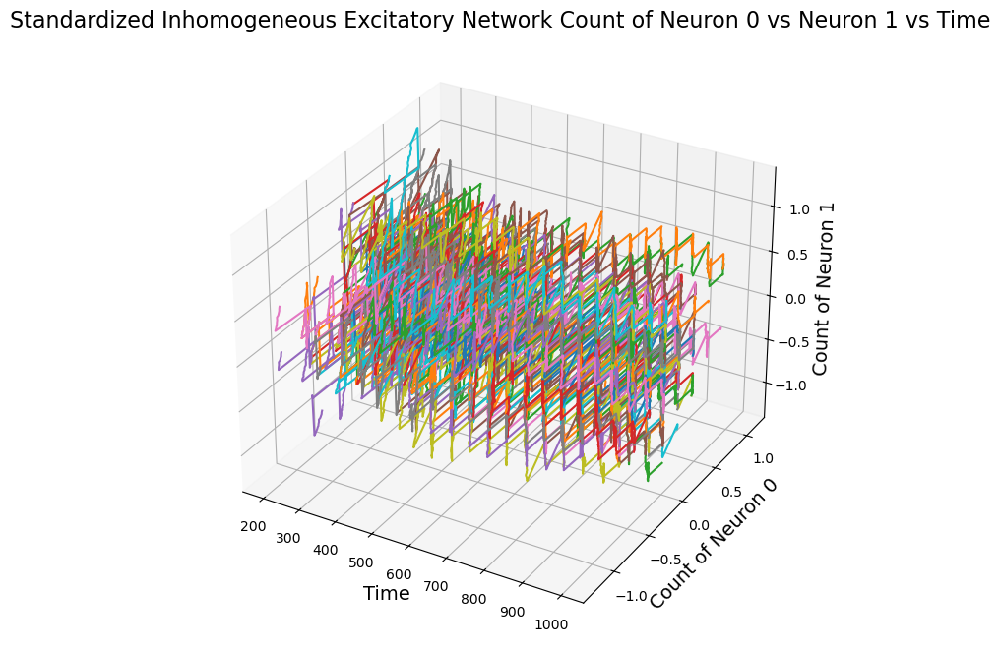

In [193]:
#plot_standardized_staircase_3d(random_samples_ex, empirical_mean_ex, empirical_std_dev_ex, t0, num_samples=5)
plot_standardized_staircase_3d(count_ex, empirical_mean_ex, empirical_std_dev_ex, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

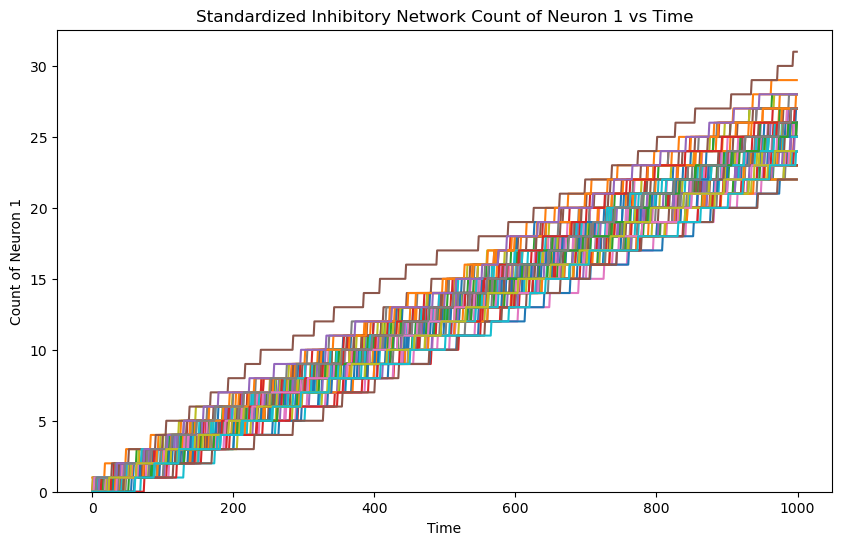

In [194]:
#plot_count_neuron1_vs_time(random_samples_in, num_samples = 5)
plot_count_neuron1_vs_time(count_in, num_samples, title = 'Standardized Inhibitory Network Count of Neuron 1 vs Time')

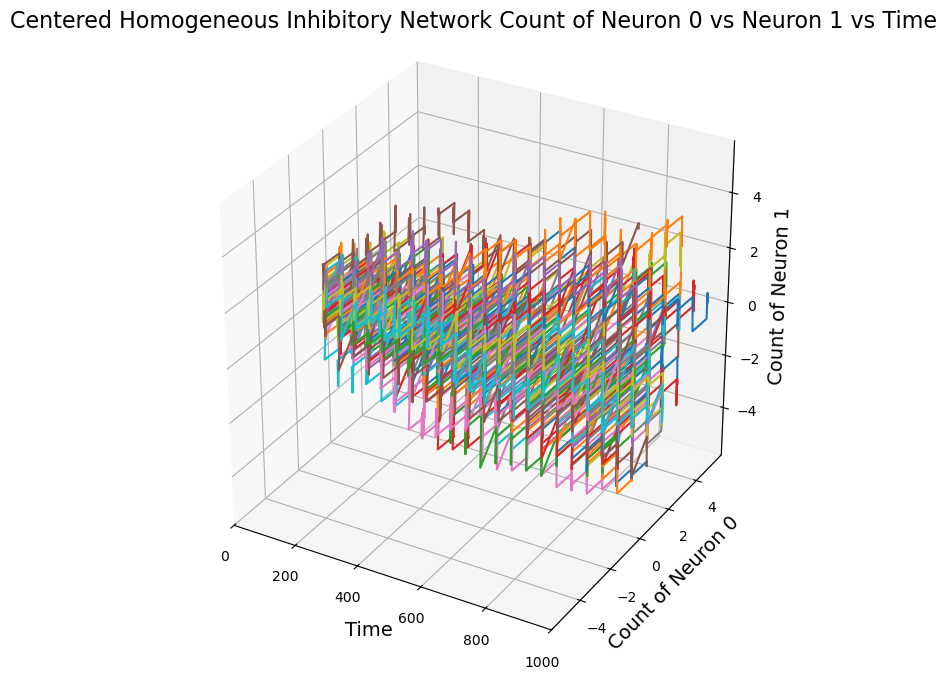

In [195]:
#plot_centered_staircase_3d(random_samples_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples= 5)
plot_centered_staircase_3d(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

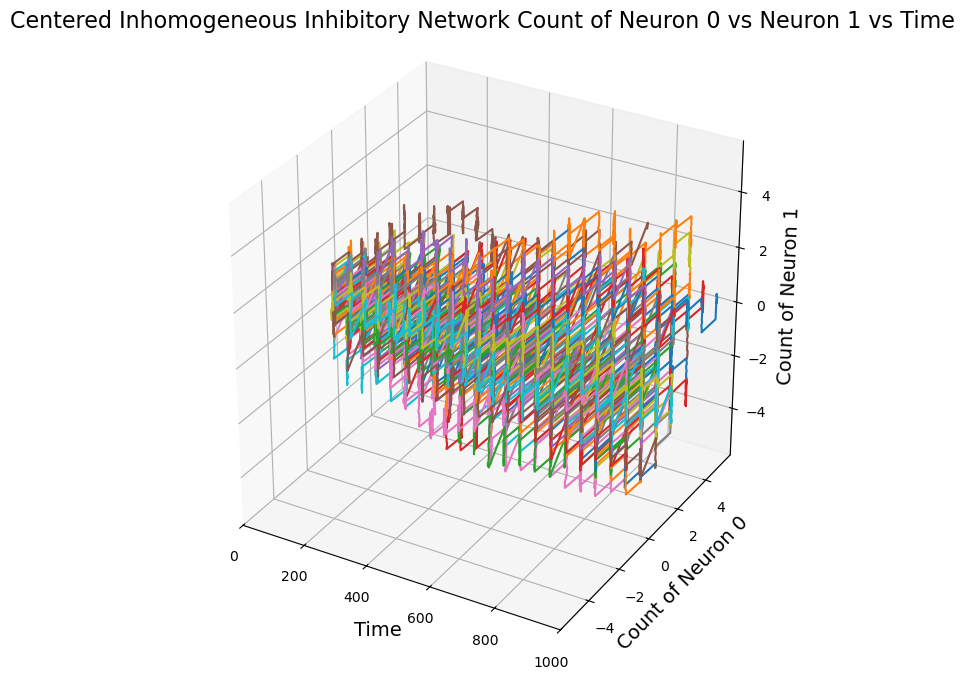

In [196]:
#plot_centered_staircase_3d(random_samples_in, empirical_mean_in, empirical_std_dev_in, num_samples= 5)
plot_centered_staircase_3d(count_in, empirical_mean_in, empirical_std_dev_in, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

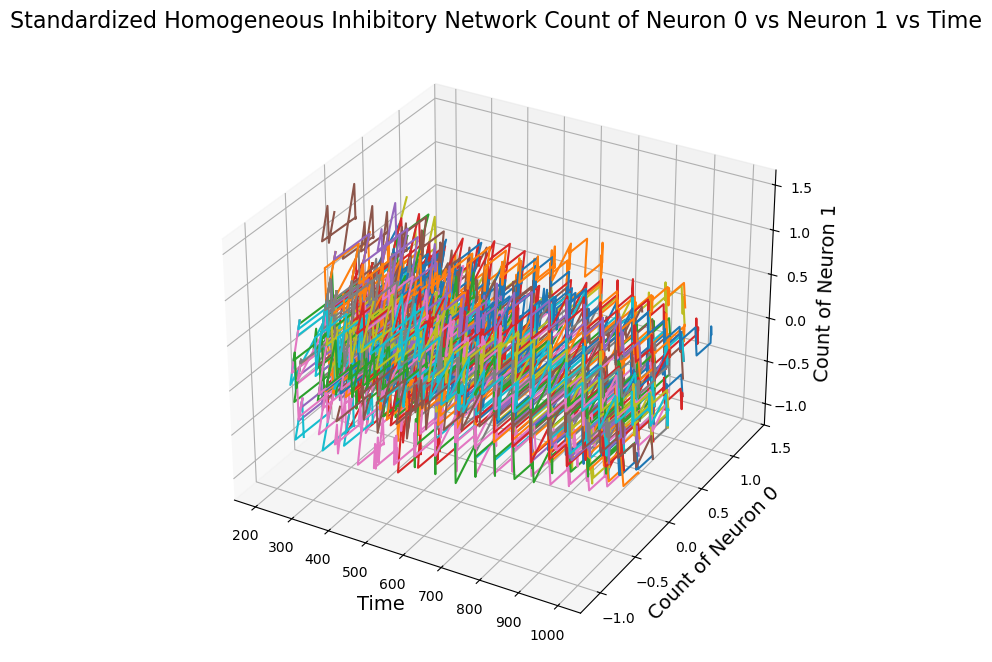

In [197]:
#plot_standardized_staircase_3d(random_samples_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, t0, num_samples=5)
plot_standardized_staircase_3d(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

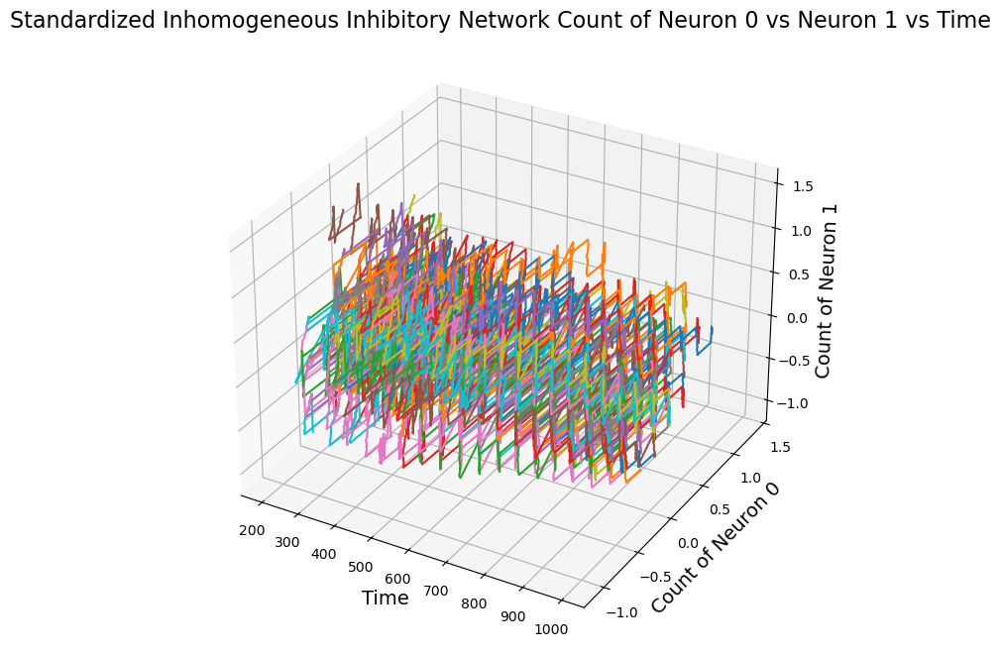

In [198]:
#plot_standardized_staircase_3d(random_samples_in, empirical_mean_in, empirical_std_dev_in, t0, num_samples=5)
plot_standardized_staircase_3d(count_in, empirical_mean_in, empirical_std_dev_in, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Poisson Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

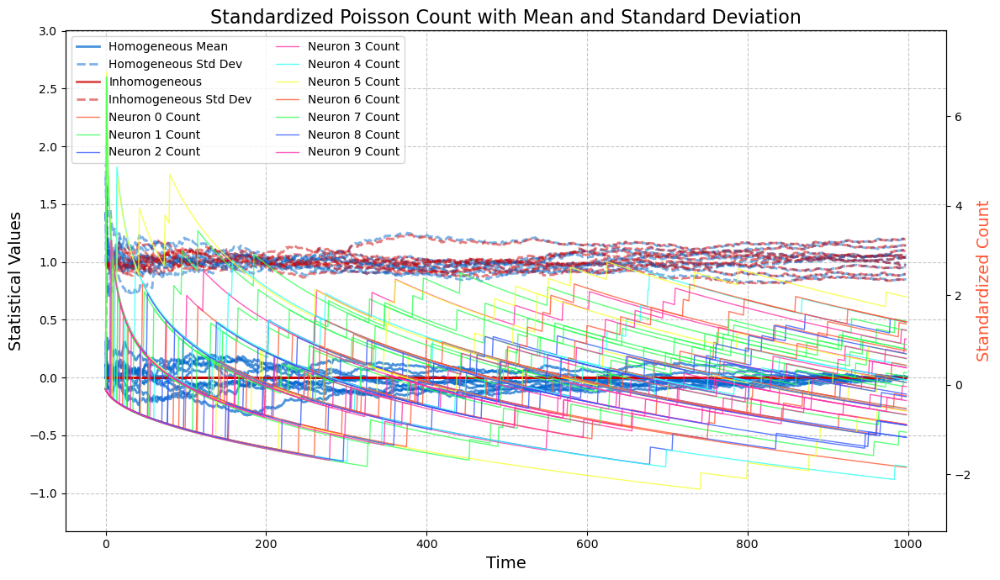

In [199]:
data_plot(stands, num_samples, standardized_mean, standardized_mean_emp, 
              standardized_std, standardized_std_emp, num_neurons, title= 'Standardized Poisson Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Exctitatory Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

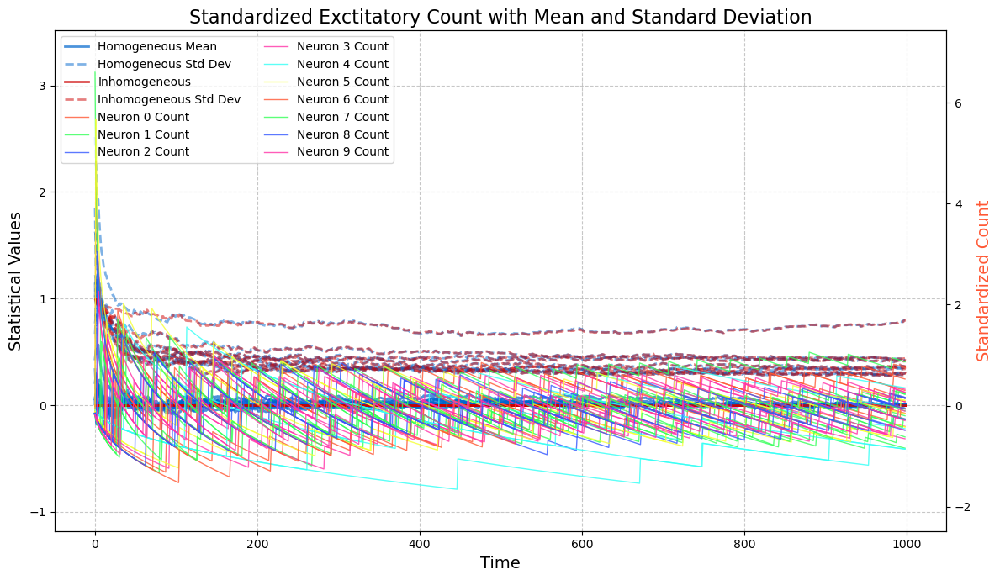

In [200]:
data_plot(stands_ex, num_samples, standardized_mean_ex, standardized_mean_ex_emp, 
              standardized_std_ex, standardized_std_ex_emp, num_neurons, title='Standardized Exctitatory Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Inhibitory Count with Mean and Standard Deviation'}, xlabel='Time', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

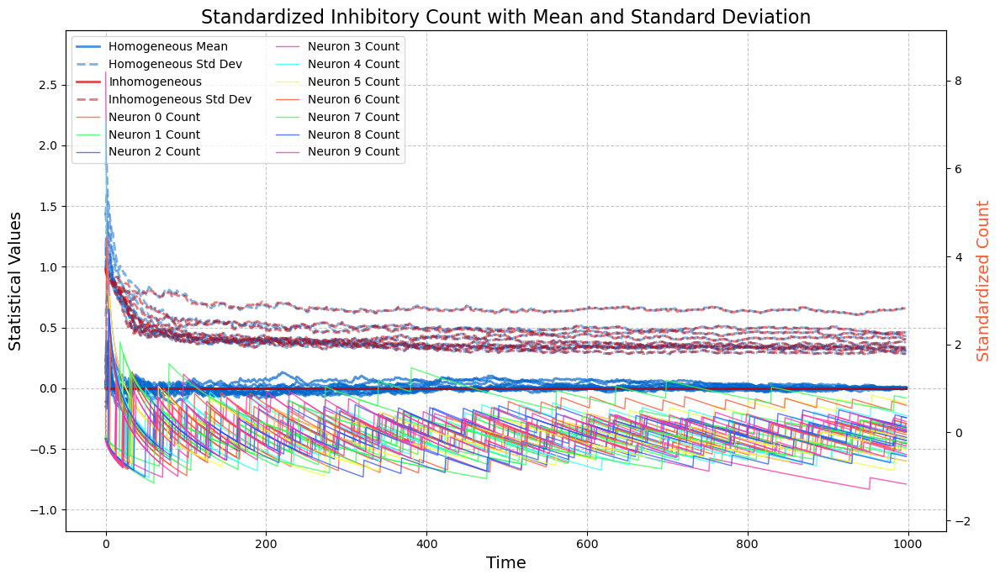

In [201]:
data_plot(stands_in, num_samples, standardized_mean_in, standardized_mean_in_emp, 
              standardized_std_in, standardized_std_in_emp, num_neurons, title='Standardized Inhibitory Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)